In [1]:
import os
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

In [2]:
files = os.listdir('./distilMBERT_percentile_data')

In [3]:
files

['distilbert-base-multilingual-cased__opus100.csv',
 'distilbert-base-multilingual-cased__opus100_filtered_percent_25.csv',
 'distilbert-base-multilingual-cased__opus100_filtered_percent_37.csv',
 'distilbert-base-multilingual-cased__opus100_filtered_percent_50.csv',
 'distilbert-base-multilingual-cased__opus100_filtered_percent_62.csv',
 'distilbert-base-multilingual-cased__opus100_filtered_percent_75.csv']

In [4]:
unfiltered_df = pd.read_csv('./distilMBERT_percentile_data/distilbert-base-multilingual-cased__opus100.csv')

In [5]:
methods = list(set(unfiltered_df['method'].values))

langs = []

for col in unfiltered_df.columns:
    if col.find('final_eval') != -1:
        langs.append(col)

In [6]:
dfs = [pd.read_csv(f'./distilMBERT_percentile_data/{file}') for file in files]

In [7]:
langs = sorted([col for col in unfiltered_df.columns if 'final_eval' in col])

In [8]:
def mean_confidence_interval(data, confidence=0.95):
    n = len(data)
    m, se = np.mean(data), np.std(data, ddof=1) / np.sqrt(n)
    h = se * stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

In [9]:

def format_method_name(method):
    if 'freeze_realign_unfreeze' in method:
        if 'front' in method:
            return 'Partial Freeze (Front)'
        elif 'back' in method or '_last_6' in method:
            return 'Partial Freeze (Back)'
        
    
    
    return method.replace('_', ' ').title()

In [10]:
import wandb
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import seaborn as sns
import pandas as pd


api = wandb.Api()


workspace = "align_freeze"


finetuning_project_name = "3nl_34langs_baseline_udpos"


projects = ['3nl_34langs_baseline_udpos',
            '3nl_34langs_before_fastalign_udpos',
            '3nl_34langs_before_awesome_udpos',
            '3nl_34langs_before_dico_udpos',
            '3nl_34langs_during_fastalign_udpos',
            '3nl_34langs_during_awesome_udpos',
            '3nl_34langs_during_dico_udpos',
            '3nl_34langs_freeze_realign_unfreeze_fastalign_udpos',
            '3nl_34langs_freeze_realign_unfreeze_awesome_udpos',
            '3nl_34langs_freeze_realign_unfreeze_dico_udpos',
            '3nl_34langs_freeze_realign_unfreeze_last_6_fastalign_udpos',
            '3nl_34langs_freeze_realign_unfreeze_last_6_awesome_udpos',
            '3nl_34langs_freeze_realign_unfreeze_last_6_dico_udpos',
            '3nl_34langs_during_partial_freeze_front_fastalign_udpos',
            '3nl_34langs_during_partial_freeze_front_awesome_udpos',
            '3nl_34langs_during_partial_freeze_front_dico_udpos',
            '3nl_34langs_during_partial_freeze_back_fastalign_udpos',
            '3nl_34langs_during_partial_freeze_back_awesome_udpos',
            '3nl_34langs_during_partial_freeze_back_dico_udpos']


langs = ["same", "avg", "af", "ar", "bg", "ca", "cs", "da", "de", "el", "es", "fa", "fi", "fr", "he", "hi",
         "hu", "it", "ja", "ko", "lt", 'lv', 'no', 'pl', 'pt', 'ro', 'ru', 'sk', 'sl', 'sv', 'ta', 'th', 'tr', 'uk',
         'vi', 'zh']


def fetch_and_process_runs(source, _langs, username="felixgaschi", method_name=None):
    runs_data = {lang: [] for lang in _langs}
    
    
    if source.endswith('.csv'):
        df = pd.read_csv(source)
        
        
        if method_name:
            df = df[df['method'] == method_name]
        
        
        for lang in _langs:
            accuracy_key = f'eval_{lang}_accuracy'
            if accuracy_key in df.columns:
                runs_data[lang] = df[accuracy_key].dropna().tolist()
            else:
                print(f"{lang} not in CSV...")
    else:
    
        runs = api.runs(f"{workspace}/{source}")
        for run in runs:
            if run.user.username == username:  
                for lang in langs:
                    accuracy_key = f"eval_{lang}_accuracy"
                    accuracy = run.summary.get(accuracy_key)
                    if accuracy is not None:
                        runs_data[lang].append(accuracy)
        assert all([len(runs) == 5 for language, runs in runs_data.items()])
    return runs_data


In [11]:
trimmed_keys = []
xlmr_project_data = {}
for project in projects:
    key = project.replace('3nl_34langs_', "").replace('_udpos', "")
    xlmr_project_data[key] = fetch_and_process_runs(project, langs)
    trimmed_keys.append(key)

In [12]:
dmbert_data_dict = {}
for trimmed_key in trimmed_keys:    
    dmbert_data = unfiltered_df[unfiltered_df['method'] == trimmed_key]

    cols = []
    for col in dmbert_data.columns:
        try:
            if col.split('_')[-2] in langs and col.find('final') != -1:
                cols.append(col)
        except:
            pass

    dmbert_data = dmbert_data[cols]

    dmbert_data_dict = {}
    for col in dmbert_data.columns:
        dmbert_data_dict[col.split('_')[-2]] = list(dmbert_data[col].values)

In [13]:

before_methods = ['before_fastalign', 'before_awesome', 'before_dico', 
                  'freeze_realign_unfreeze_fastalign', 'freeze_realign_unfreeze_awesome',
                  'freeze_realign_unfreeze_dico', 'freeze_realign_unfreeze_last_6_fastalign',
                  'freeze_realign_unfreeze_last_6_awesome','freeze_realign_unfreeze_last_6_dico']
during_methods = [key for key in trimmed_keys if key.startswith('during')]


In [14]:

dmbert_data_dict = {}


for trimmed_key in trimmed_keys:
    
    dmbert_data = unfiltered_df[unfiltered_df['method'] == trimmed_key]

    cols = []
    for col in dmbert_data.columns:
        try:
            if col.split('_')[-2] in langs and col.find('final') != -1:
                cols.append(col)
        except:
            pass

    dmbert_data = dmbert_data[cols]

    
    for lang in langs:
        
        col_name = f'final_eval_{lang}_accuracy'
        if col_name in dmbert_data.columns:
            
            if trimmed_key not in dmbert_data_dict:
                dmbert_data_dict[trimmed_key] = {}
            dmbert_data_dict[trimmed_key][lang] = list(dmbert_data[col_name].values)


all_methods = before_methods + during_methods
all_methods.insert(0, 'baseline')


method_names = {
    'baseline': 'Fine-tuning Only',
    'before_fastalign': 'Before FastAlign',
    'before_awesome': 'Before Awesome',
    'before_dico': 'Before Dict',
    'during_fastalign': 'During FastAlign',
    'during_awesome': 'During Awesome',
    'during_dico': 'During Dict',
    'freeze_realign_unfreeze_fastalign': 'Before - Front Freeze FastAlign',
    'freeze_realign_unfreeze_awesome': 'Before - Front Freeze Awesome',
    'freeze_realign_unfreeze_dico': 'Before - Front Freeze Dict',
    'freeze_realign_unfreeze_last_6_fastalign': 'Before - Back Freeze FastAlign',
    'freeze_realign_unfreeze_last_6_awesome': 'Before - Back Freeze Awesome',
    'freeze_realign_unfreeze_last_6_dico': 'Before - Back Freeze Dict',
    'during_partial_freeze_front_fastalign': 'During Front Freeze FastAlign',
    'during_partial_freeze_front_awesome': 'During Front Freeze Awesome',
    'during_partial_freeze_front_dico': 'During Front Freeze Dict',
    'during_partial_freeze_back_fastalign': 'During Back Freeze FastAlign',
    'during_partial_freeze_back_awesome': 'During Back Freeze Awesome',
    'during_partial_freeze_back_dico': 'During Back Freeze Dict',
}



plots_directory = "./xlmr_distilmbert_langs"
os.makedirs(plots_directory, exist_ok=True)

def plot_language_methods(lang, xlmr_project_data, dmbert_data_dict, all_methods, language_map):
    
    xlmr_means = []
    xlmr_conf_ints = []
    dmbert_means = []
    dmbert_conf_ints = []

    
    for method in all_methods:
        
        xlmr_data = xlmr_project_data[method].get(lang, [])
        mean, lower, upper = mean_confidence_interval(xlmr_data)
        xlmr_means.append(mean)
        xlmr_conf_ints.append((lower, upper))

        
        dmbert_data = dmbert_data_dict[method].get(lang, [])
        mean, lower, upper = mean_confidence_interval(dmbert_data)
        dmbert_means.append(mean)
        dmbert_conf_ints.append((lower, upper))

    
    plt.figure(figsize=(14, 7))
    x_axis = np.arange(len(all_methods))

    
    xlmr_lowers, xlmr_uppers = zip(*xlmr_conf_ints)
    plt.plot(x_axis, xlmr_means, label='XLMR', color='blue')
    plt.fill_between(x_axis, xlmr_lowers, xlmr_uppers, color='blue', alpha=0.1)

    
    dmbert_lowers, dmbert_uppers = zip(*dmbert_conf_ints)
    plt.plot(x_axis, dmbert_means, label='DistilMBERT', color='orange')
    plt.fill_between(x_axis, dmbert_lowers, dmbert_uppers, color='orange', alpha=0.1)

    
    professional_method_names = [method_names.get(method, 'Unknown Method') for method in all_methods]
    plt.xticks(x_axis, professional_method_names, rotation=45, ha='right', fontsize=10)

    
    

    plt.xlabel('Methods', fontsize=12)
    plt.ylabel('Accuracy', fontsize=12)
    plt.title(f'Accuracy across methods for {language_map[lang]} for PoS', fontsize=14)

    plt.legend()
    plt.tight_layout()
    
    
    plt.show()


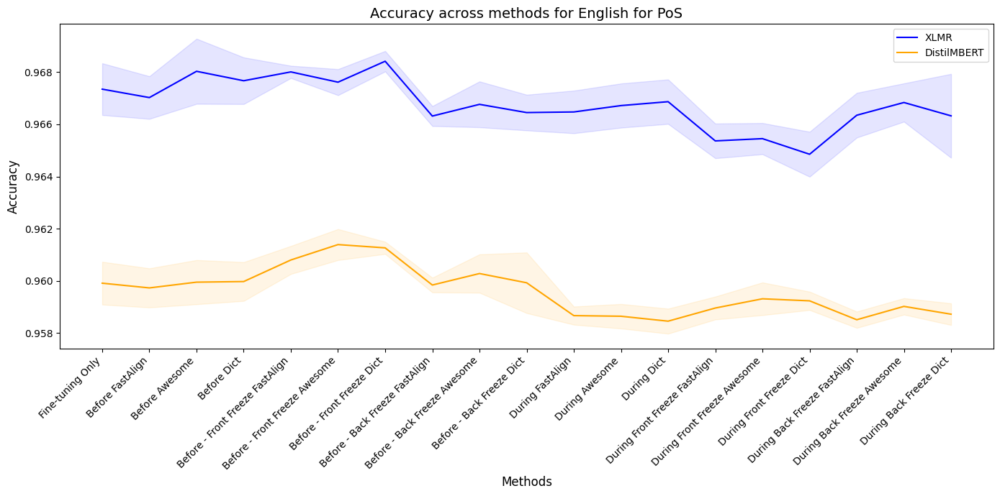

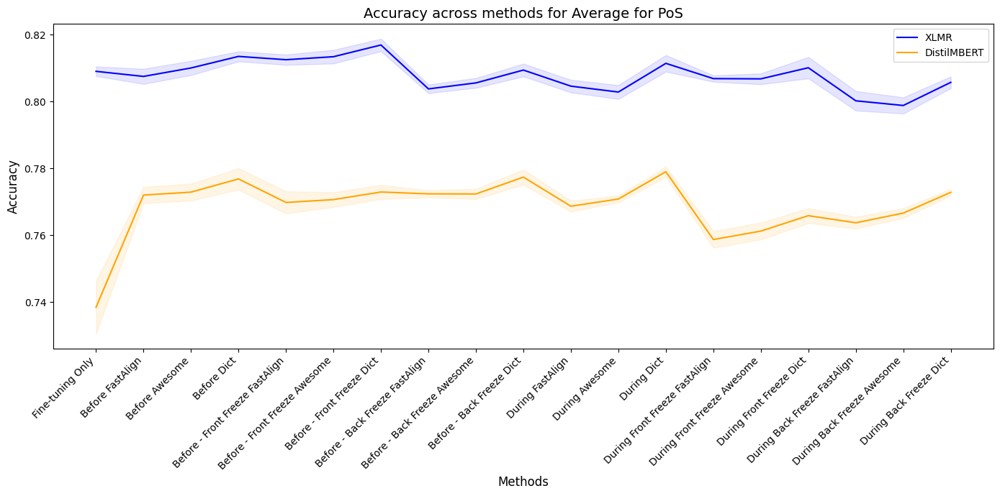

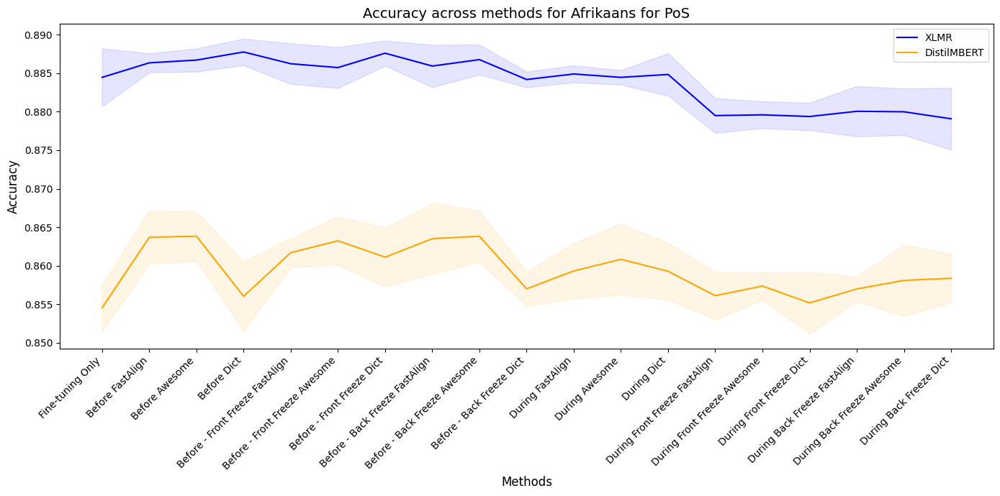

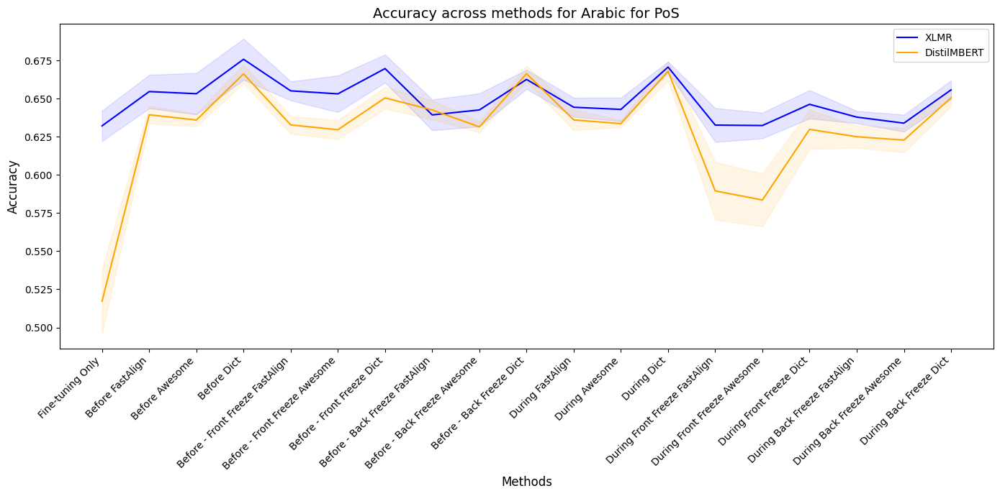

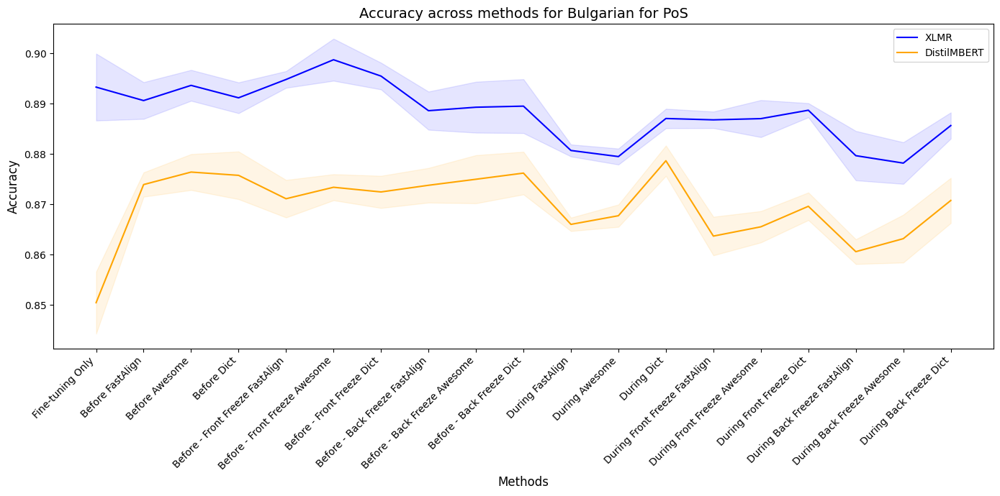

...

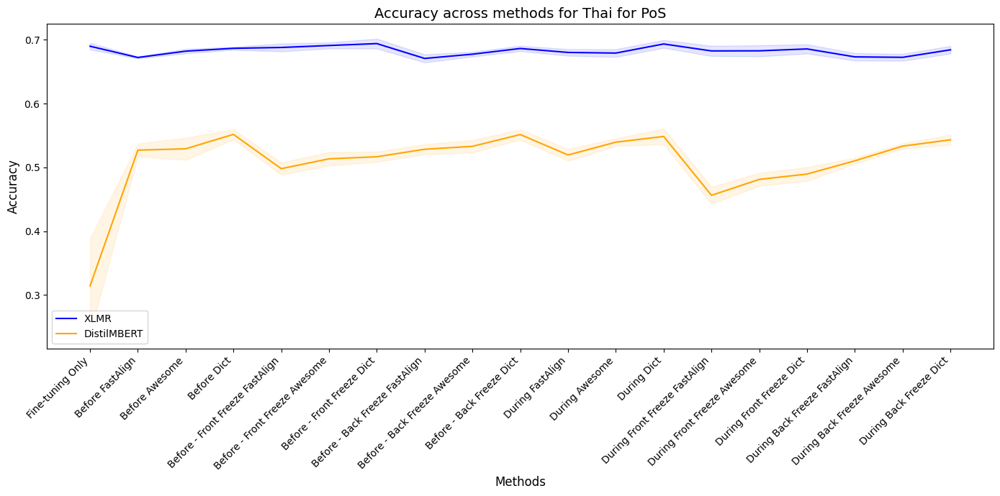

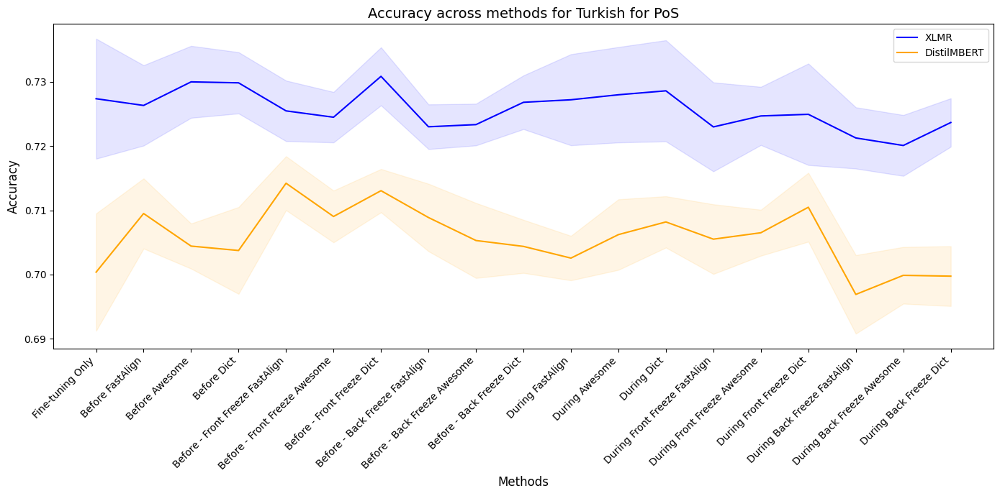

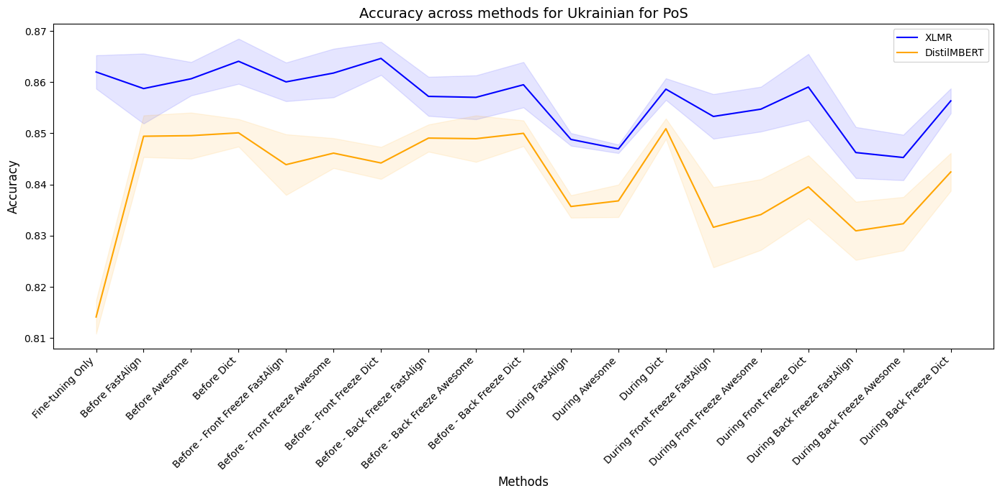

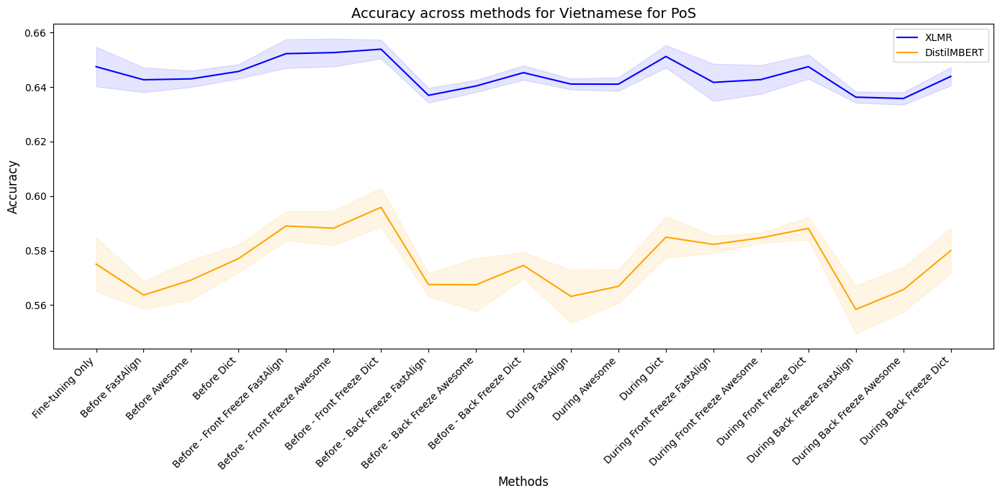

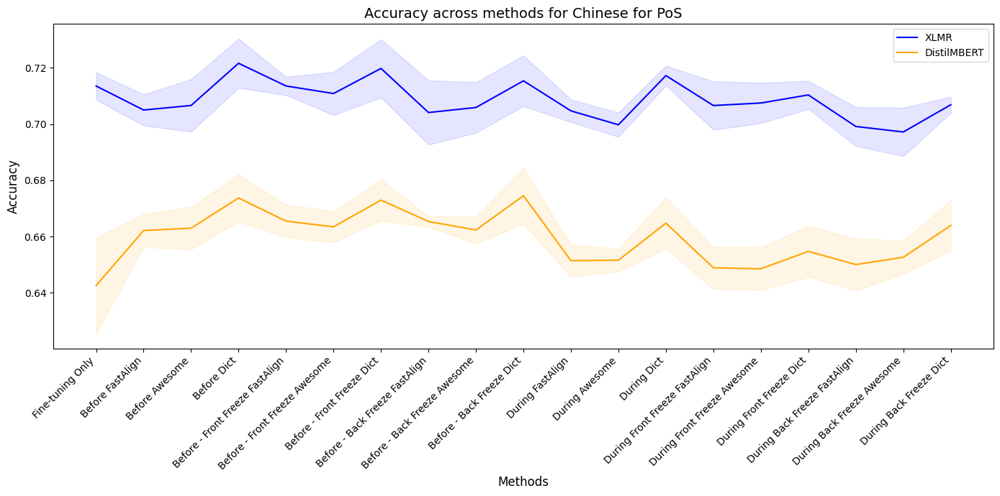

In [15]:
language_map = {
    "same": "English",
    "avg": "Average",
    "af": "Afrikaans",
    "ar": "Arabic",
    "bg": "Bulgarian",
    "ca": "Catalan",
    "cs": "Czech",
    "da": "Danish",
    "de": "German",
    "el": "Greek",
    "es": "Spanish",
    "fa": "Persian",
    "fi": "Finnish",
    "fr": "French",
    "he": "Hebrew",
    "hi": "Hindi",
    "hu": "Hungarian",
    "it": "Italian",
    "ja": "Japanese",
    "ko": "Korean",
    "lt": "Lithuanian",
    "lv": "Latvian",
    "no": "Norwegian",
    "pl": "Polish",
    "pt": "Portuguese",
    "ro": "Romanian",
    "ru": "Russian",
    "sk": "Slovak",
    "sl": "Slovenian",
    "sv": "Swedish",
    "ta": "Tamil",
    "th": "Thai",
    "tr": "Turkish",
    "uk": "Ukrainian",
    "vi": "Vietnamese",
    "zh": "Chinese"
}



for lang in langs:
    plot_language_methods(lang, xlmr_project_data, dmbert_data_dict, all_methods, language_map)

No valid in-language baseline data file found for English
No valid in-language baseline data file found for Average


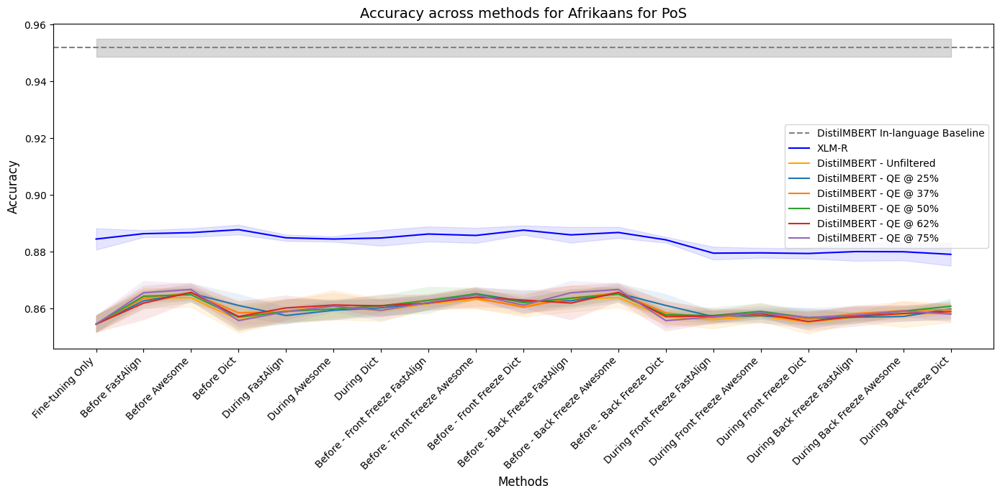

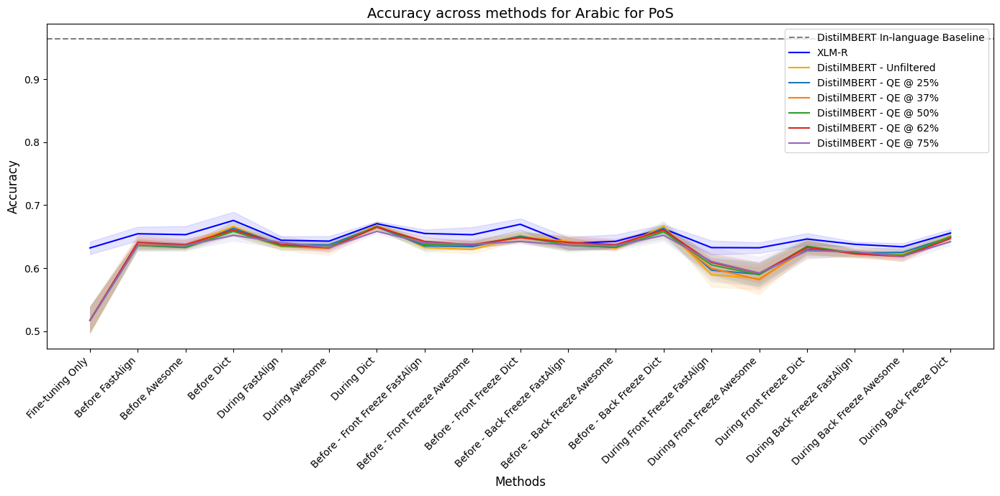

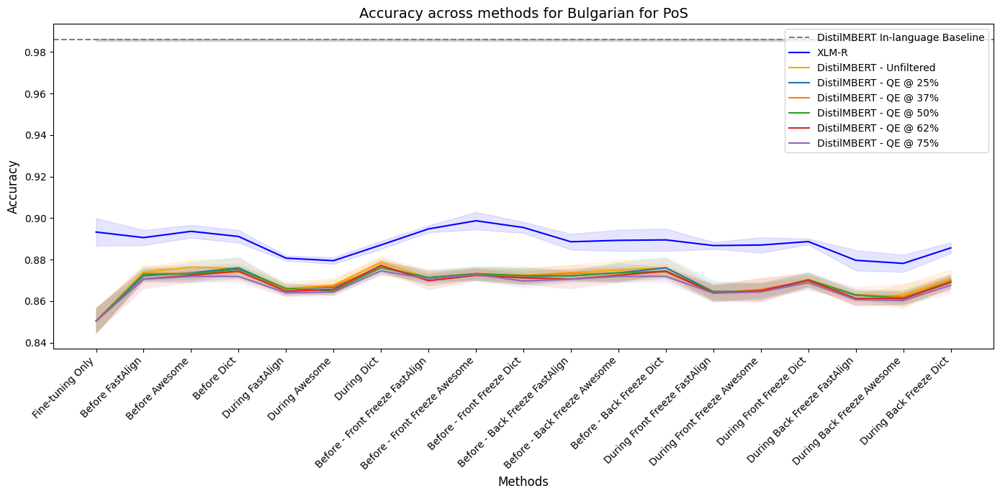

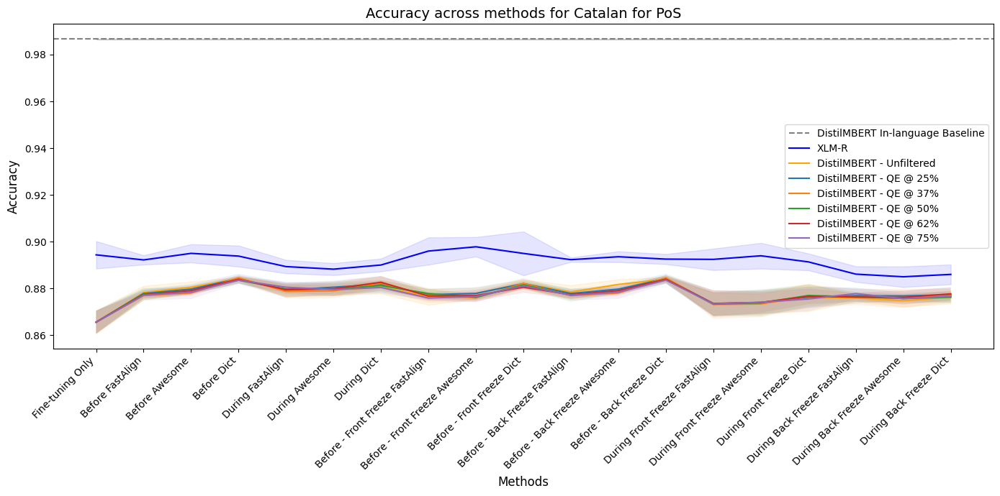

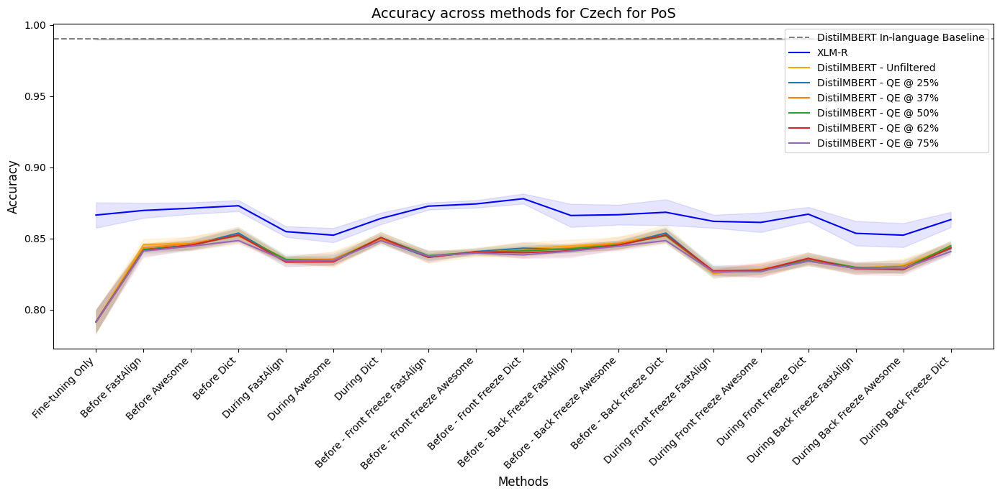

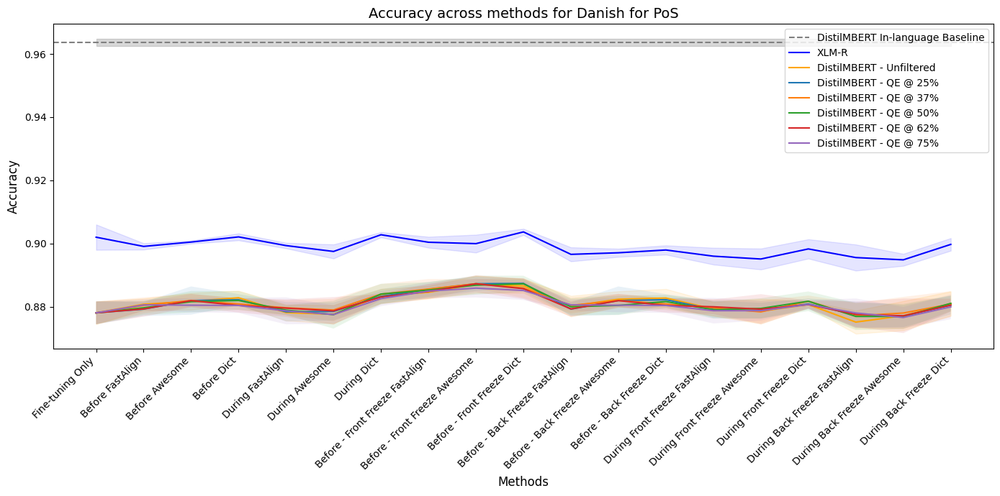

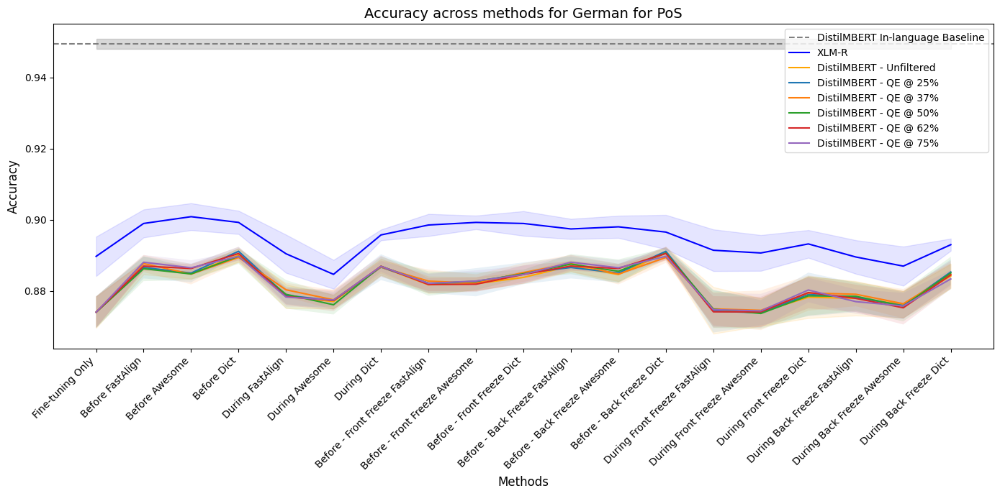

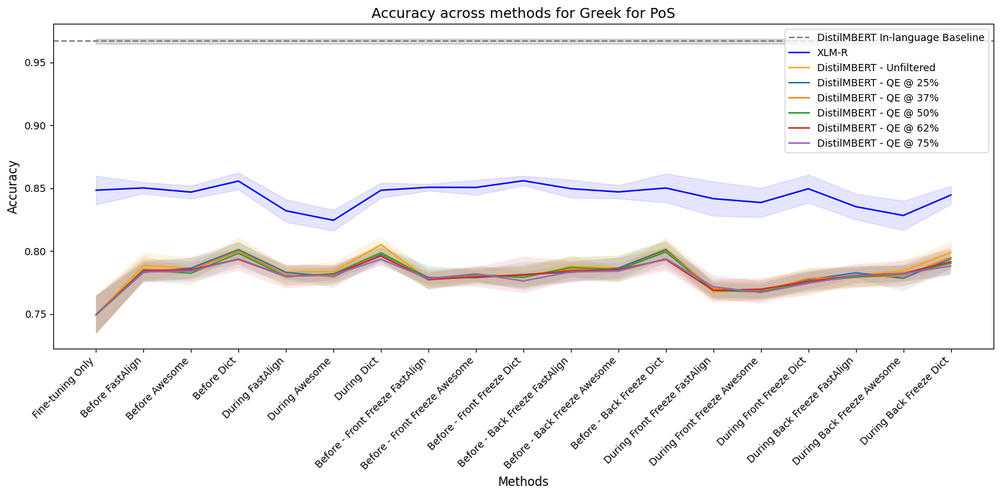

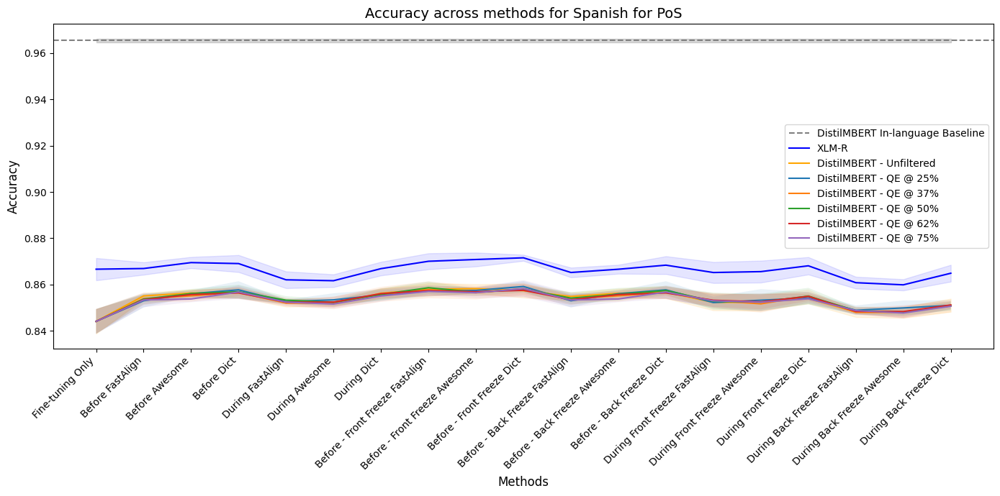

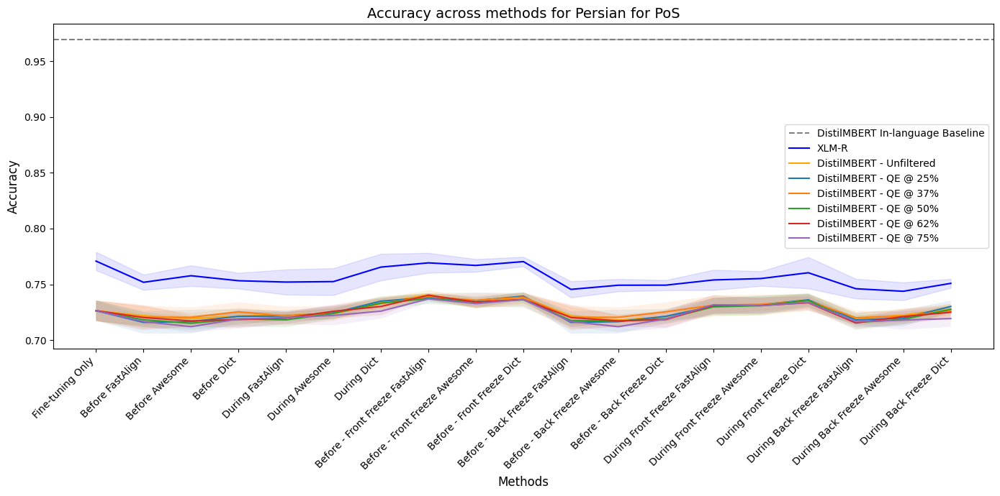

No valid in-language baseline data file found for Finnish


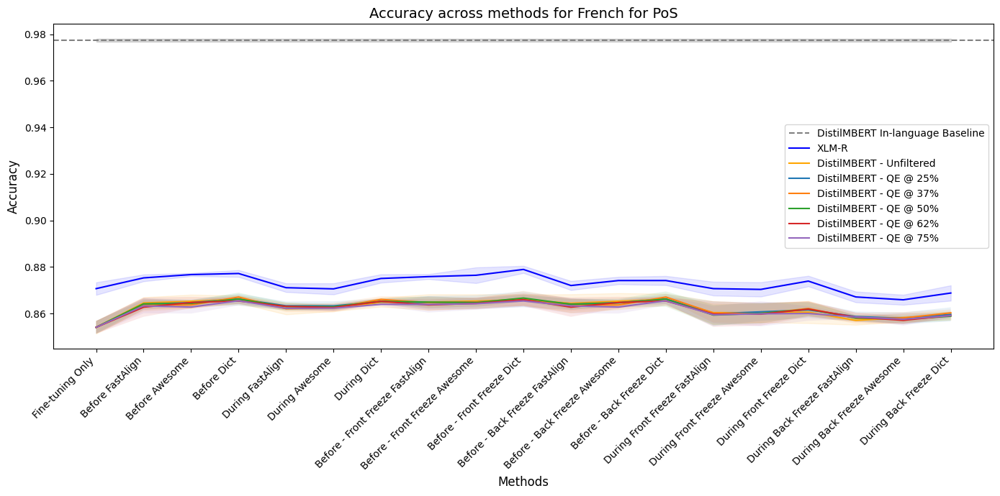

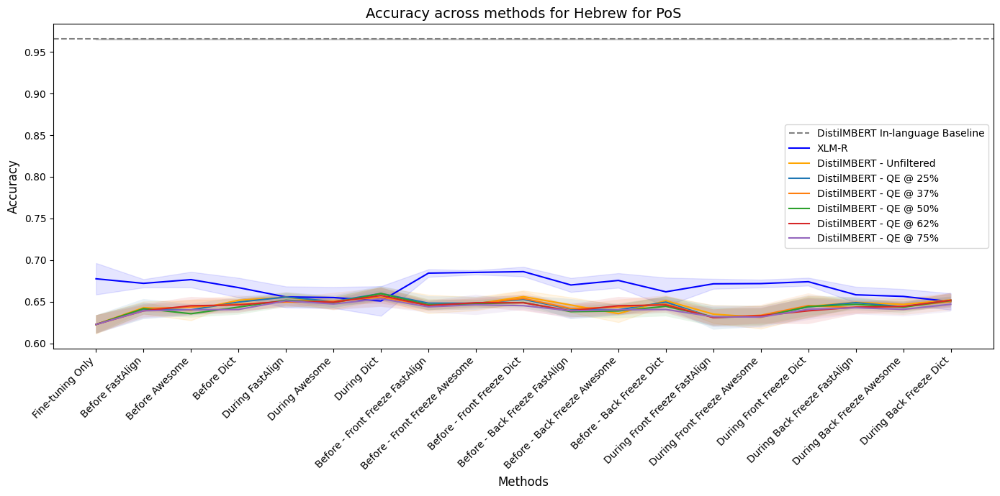

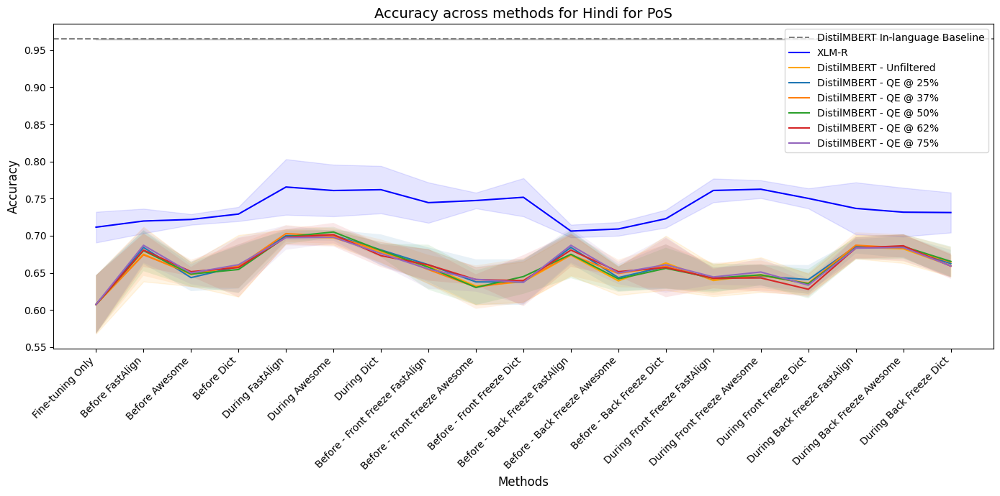

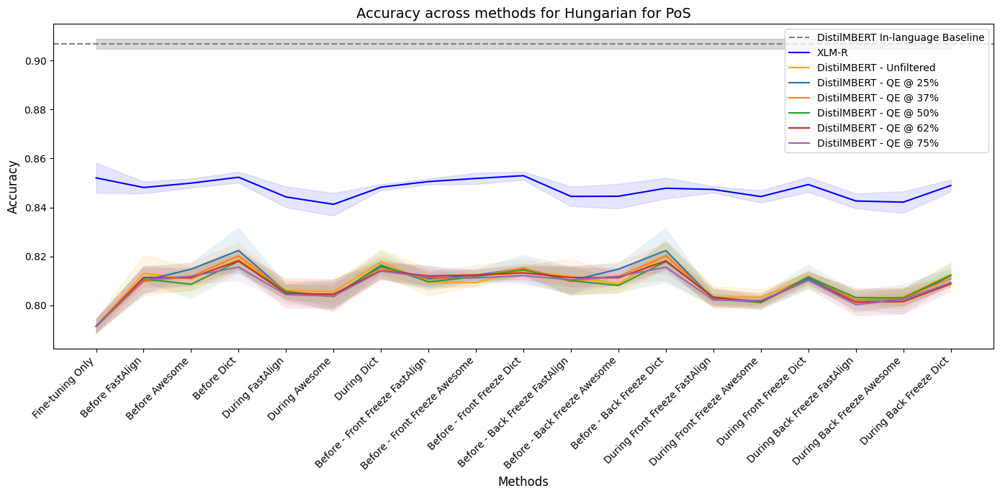

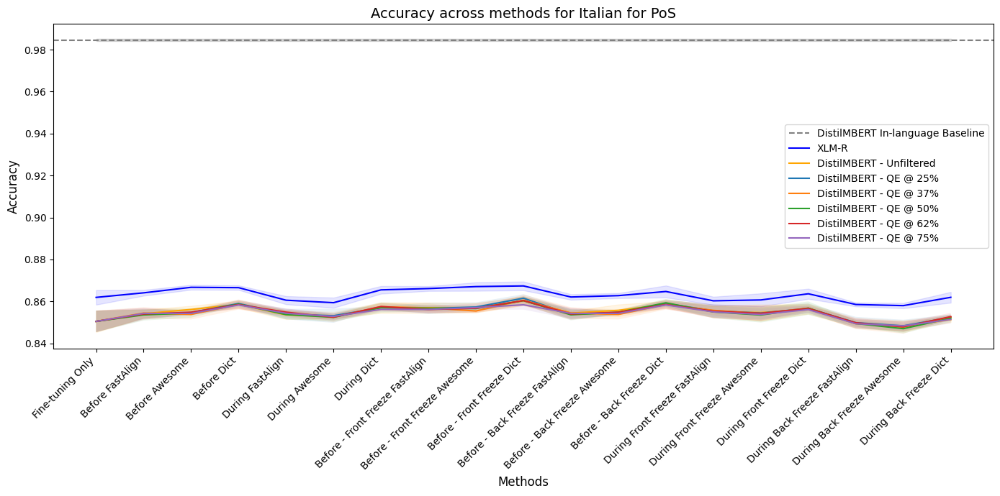

...

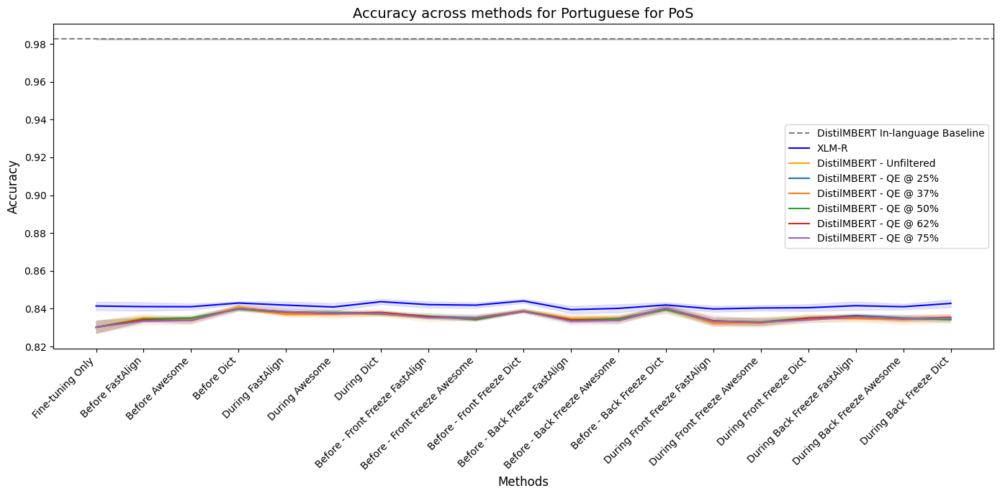

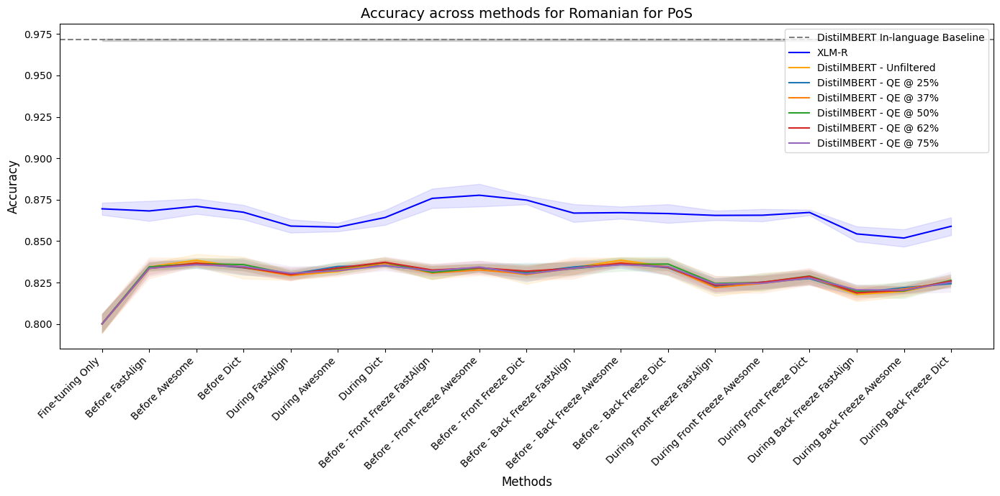

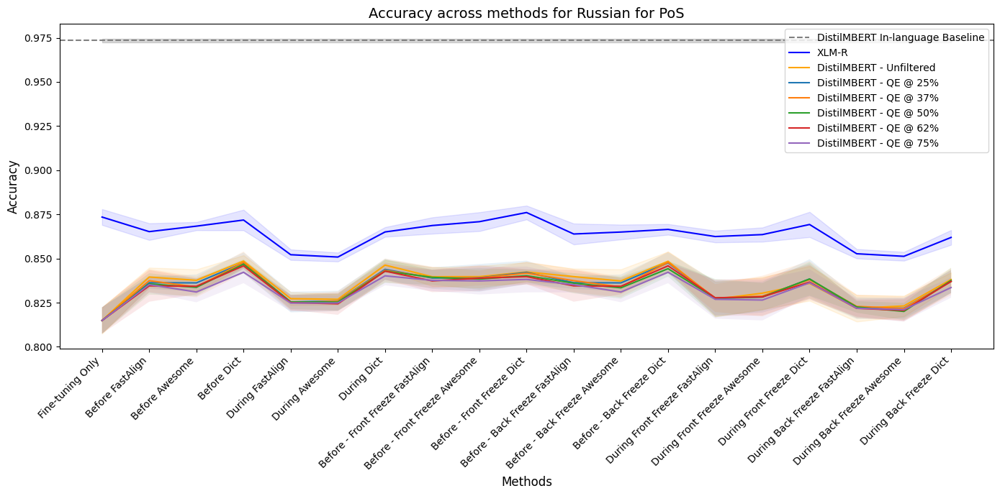

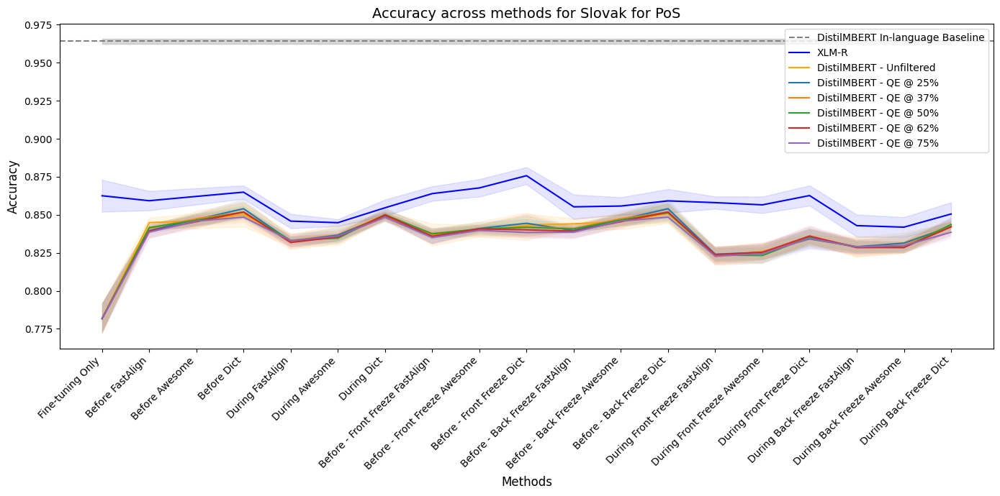

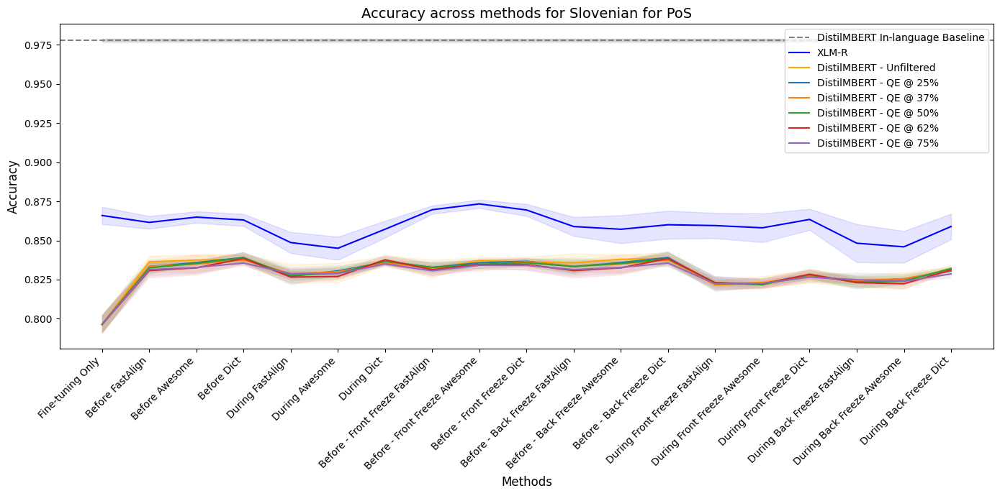

No valid in-language baseline data file found for Swedish


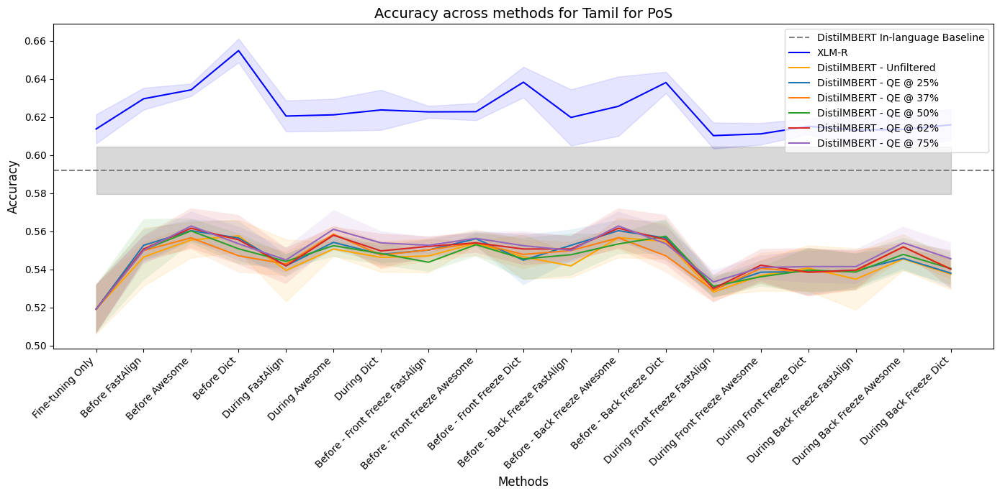

No valid in-language baseline data file found for Thai
No valid in-language baseline data file found for Turkish


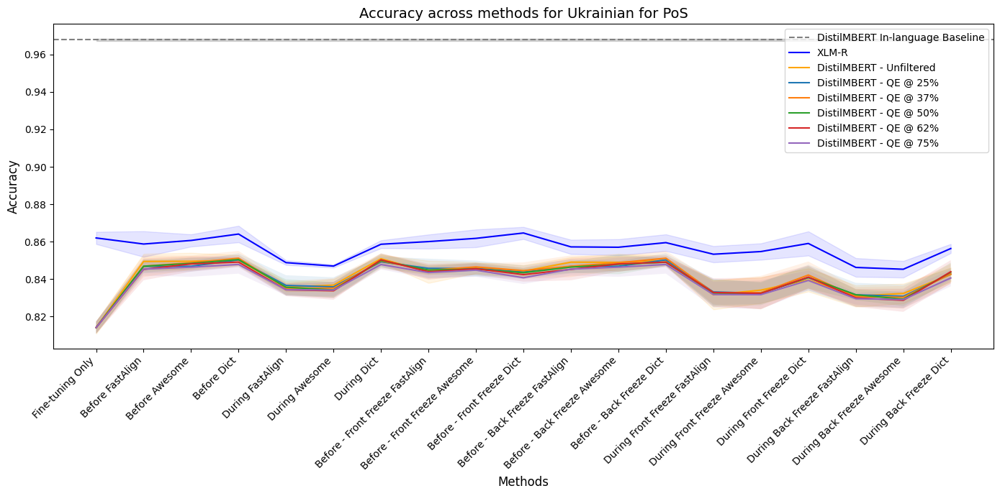

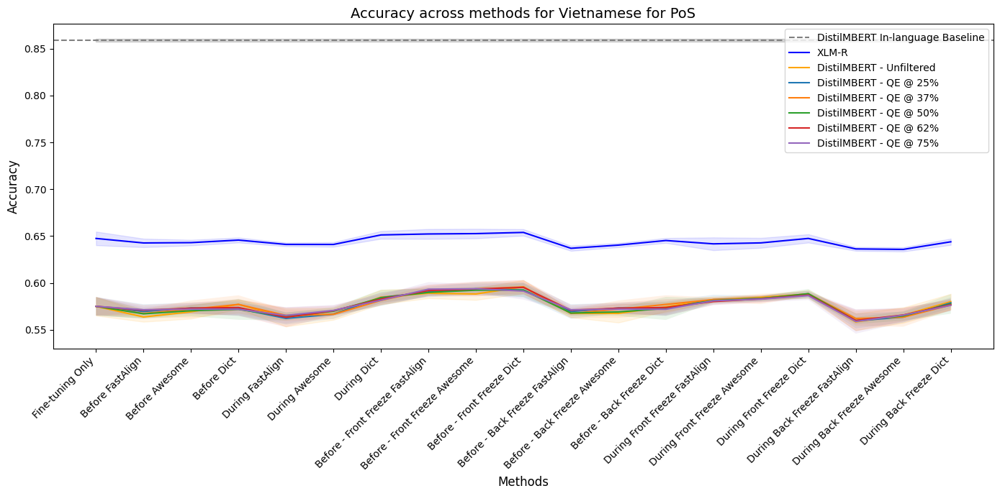

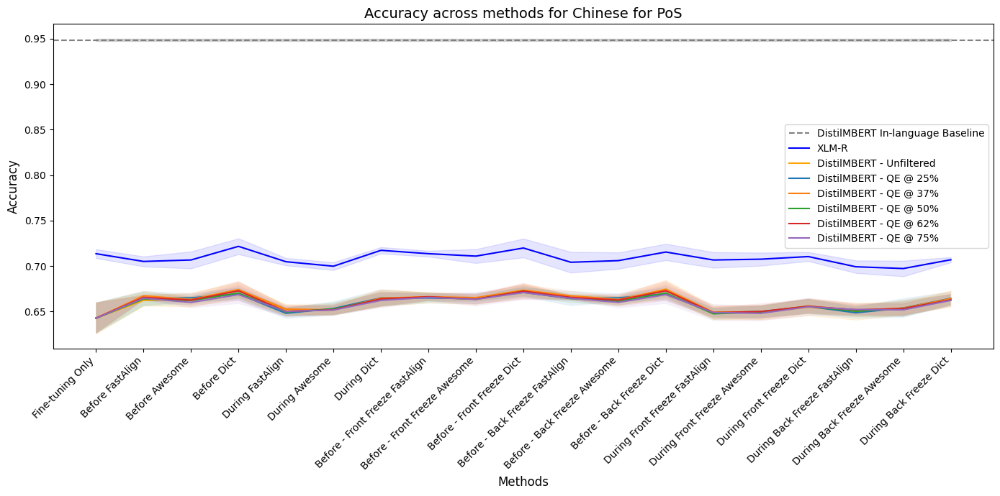

In [16]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats

def mean_confidence_interval(data, confidence=0.95):
    if len(data) > 0:
        a = 1.0 * np.array(data)
        n = len(a)
        m, se = np.mean(a), scipy.stats.sem(a)
        h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
        return m, m-h, m+h
    else:
        return 0, 0, 0
        

plots_directory = "./distilmbert_lang_comparison"
os.makedirs(plots_directory, exist_ok=True)

def plot_language_methods(lang, in_lang_data, xlmr_project_data, dmbert_data_dict, all_methods, language_map):
    xlmr_means = []
    xlmr_conf_ints = []
    dmbert_means = []
    dmbert_conf_ints = []
    filtered_means = []
    filtered_conf_ints = []

    filtered_distilmbert_mean = None
    filtered_distilmbert_lower = None
    filtered_distilmbert_upper = None

    for method in all_methods:
        xlmr_data = xlmr_project_data[method].get(lang, [])
        mean, lower, upper = mean_confidence_interval(xlmr_data)
        xlmr_means.append(mean)
        xlmr_conf_ints.append((lower, upper))

        dmbert_data = dmbert_data_dict.get(method, {}).get(lang, [])
        mean, lower, upper = mean_confidence_interval(dmbert_data)
        dmbert_means.append(mean)
        dmbert_conf_ints.append((lower, upper))

        if method == 'baseline':
            filtered_distilmbert_mean = mean
            filtered_distilmbert_lower = lower
            filtered_distilmbert_upper = upper

        filtered_data = []
        for file in filtered_files:
            filtered_data.extend(pd.read_csv(file)[f'final_eval_{lang}_accuracy'].dropna().tolist())
        mean, lower, upper = mean_confidence_interval(filtered_data)
        filtered_means.append(mean)
        filtered_conf_ints.append((lower, upper))

    plt.figure(figsize=(14, 7))
    x_axis = np.arange(len(all_methods))

    if in_lang_data:
        in_lang_mean, in_lang_lower, in_lang_upper = mean_confidence_interval(in_lang_data)
        plt.axhline(y=in_lang_mean, color='gray', linestyle='--', label='DistilMBERT In-language Baseline')
        plt.fill_between(x_axis, [in_lang_lower]*len(x_axis), [in_lang_upper]*len(x_axis), color='gray', alpha=0.3)

    xlmr_lowers, xlmr_uppers = zip(*xlmr_conf_ints) if xlmr_conf_ints[0] else ([], [])
    plt.plot(x_axis, xlmr_means, label='XLM-R', color='blue')
    plt.fill_between(x_axis, xlmr_lowers, xlmr_uppers, color='blue', alpha=0.1)

    dmbert_lowers, dmbert_uppers = zip(*dmbert_conf_ints) if dmbert_conf_ints[0] else ([], [])
    plt.plot(x_axis, dmbert_means, label='DistilMBERT - Unfiltered', color='orange')
    plt.fill_between(x_axis, dmbert_lowers, dmbert_uppers, color='orange', alpha=0.1)

    filtered_data = {}
    for file in filtered_files:
        percentage = file.split('_')[-1].split('.')[0]
        filtered_data[percentage] = []
        for method in all_methods:
            data = pd.read_csv(file)[pd.read_csv(file)['method'] == method][f'final_eval_{lang}_accuracy'].dropna().tolist()
            if method == 'baseline':
                mean, lower, upper = filtered_distilmbert_mean, filtered_distilmbert_lower, filtered_distilmbert_upper
            else:
                mean, lower, upper = mean_confidence_interval(data)
            filtered_data[percentage].append((mean, lower, upper))

    for percentage, data in filtered_data.items():
        means, lowers, uppers = zip(*data)
        plt.plot(x_axis, means, label=f'DistilMBERT - QE @ {percentage}%')
        plt.fill_between(x_axis, lowers, uppers, alpha=0.1)

    professional_method_names = [method_names.get(method, 'Unknown Method') for method in all_methods]
    plt.xticks(x_axis, professional_method_names, rotation=45, ha='right', fontsize=10)

    plt.xlabel('Methods', fontsize=12)
    plt.ylabel('Accuracy', fontsize=12)
    plt.title(f'Accuracy across methods for {language_map[lang]} for PoS', fontsize=14)

    plt.legend()
    plt.tight_layout()

    plot_directory = "./xlmr_distilmbert_langs"
    os.makedirs(plot_directory, exist_ok=True)
    plt.show()
    plt.savefig(os.path.join(plot_directory, f'{lang}_pos_comparison.png'))
    plt.close()

filtered_files = ['./raw_results/distilbert-base-multilingual-cased__opus100_filtered_percent_25.csv',
                  './raw_results/distilbert-base-multilingual-cased__opus100_filtered_percent_37.csv',
                  './raw_results/distilbert-base-multilingual-cased__opus100_filtered_percent_50.csv',
                  './raw_results/distilbert-base-multilingual-cased__opus100_filtered_percent_62.csv',
                  './raw_results/distilbert-base-multilingual-cased__opus100_filtered_percent_75.csv']

for lang in language_map:
    in_lang_baseline_data = None

    baseline_file_path = f'./raw_results/distilbert-base-multilingual-cased__opus100__in_language_{lang}.csv'
    if os.path.exists(baseline_file_path) and os.path.getsize(baseline_file_path) > 0:
        in_lang_baseline_data = pd.read_csv(baseline_file_path)[f'final_eval_{lang}_accuracy'].dropna().tolist()

    if in_lang_baseline_data:
        plot_language_methods(lang, in_lang_baseline_data, xlmr_project_data, dmbert_data_dict, list(method_names.keys()), language_map)
    else:
        print(f"No valid in-language baseline data file found for {language_map[lang]}")

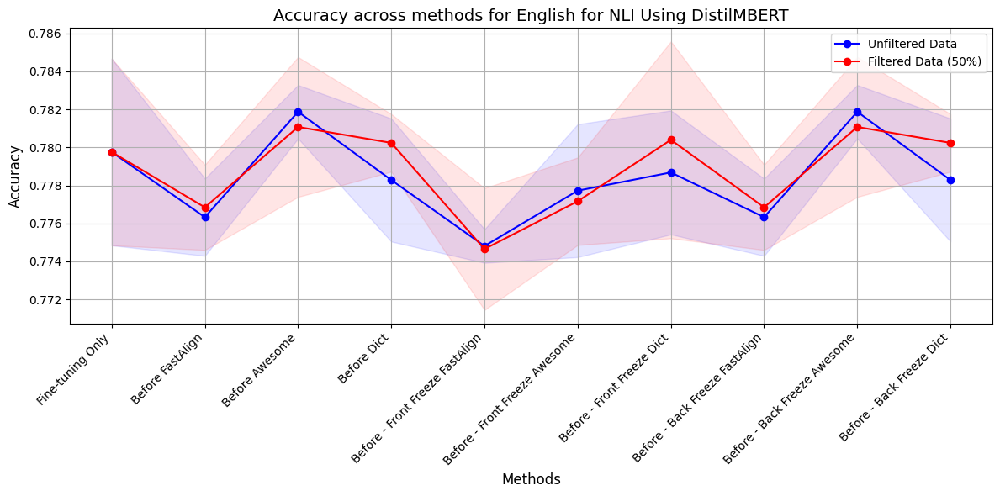

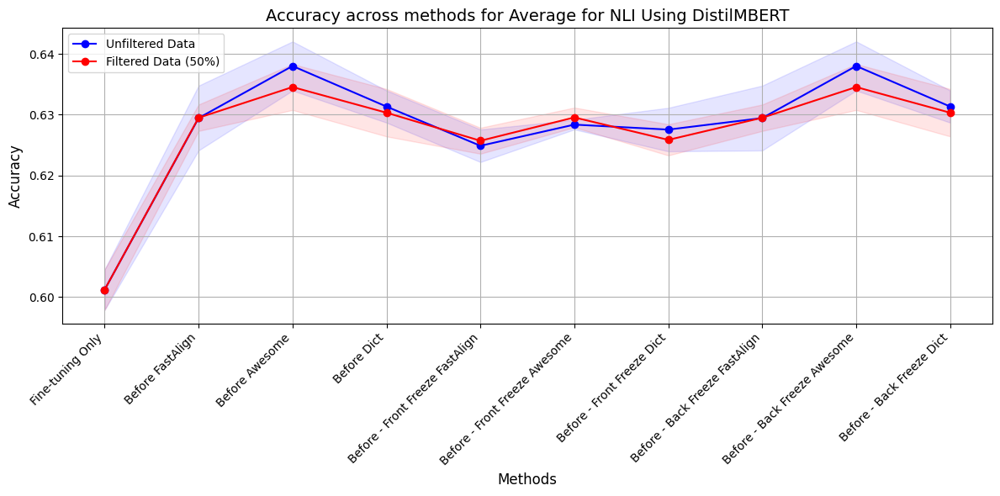

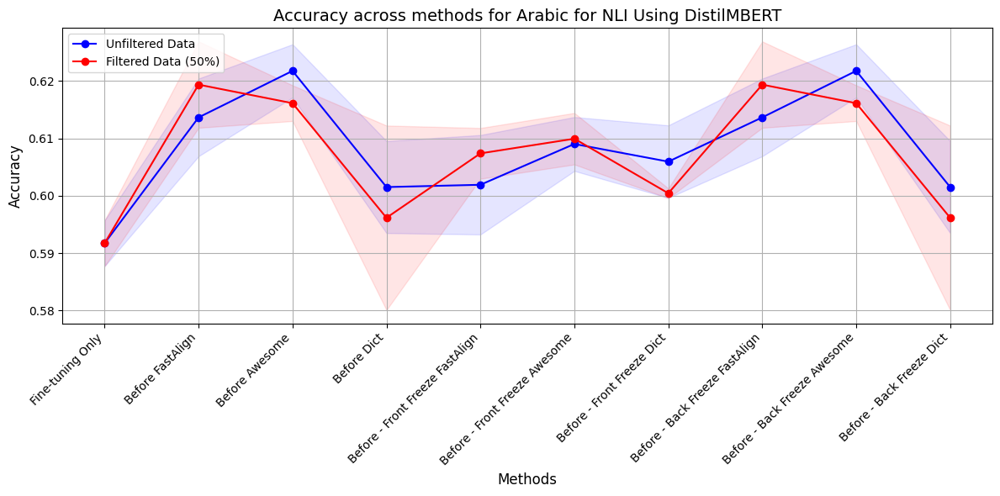

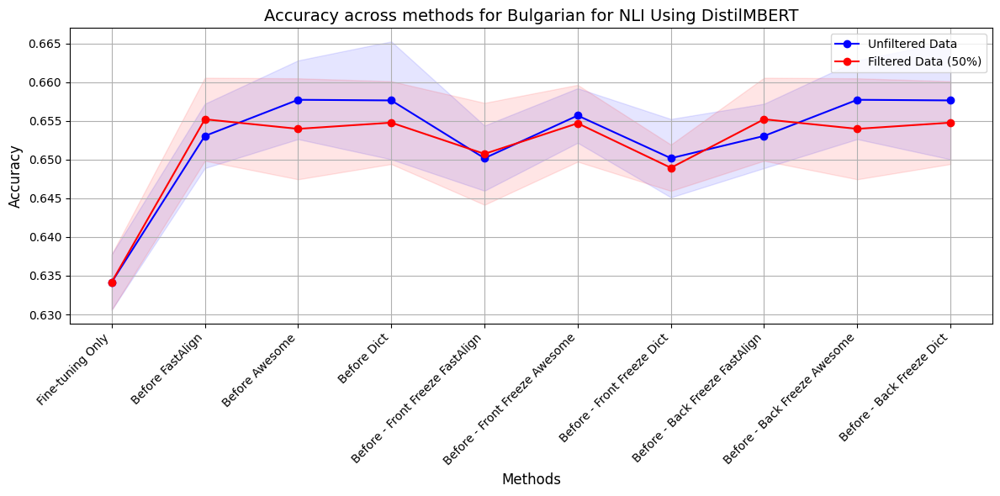

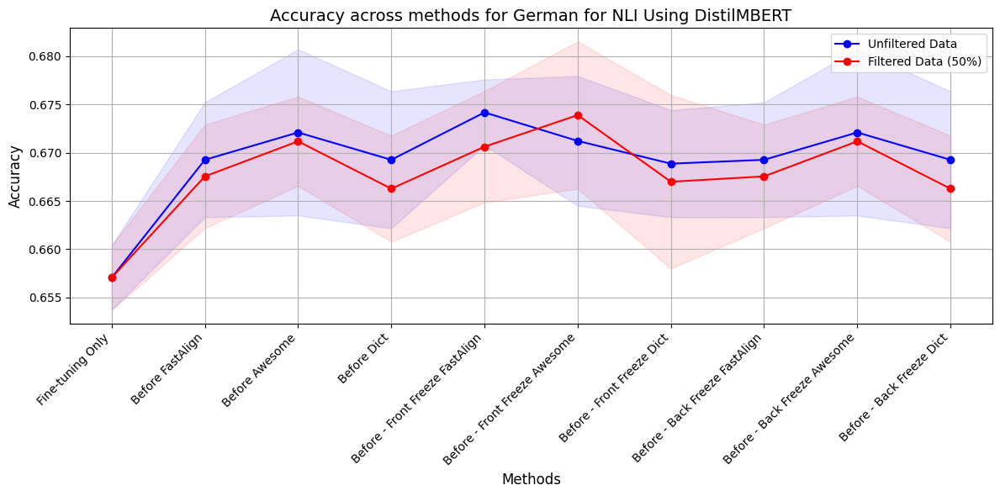

...

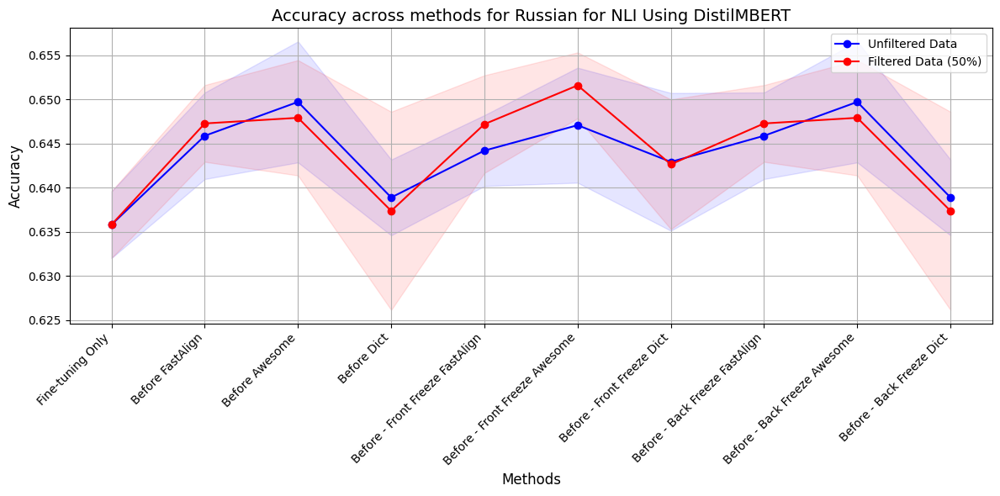

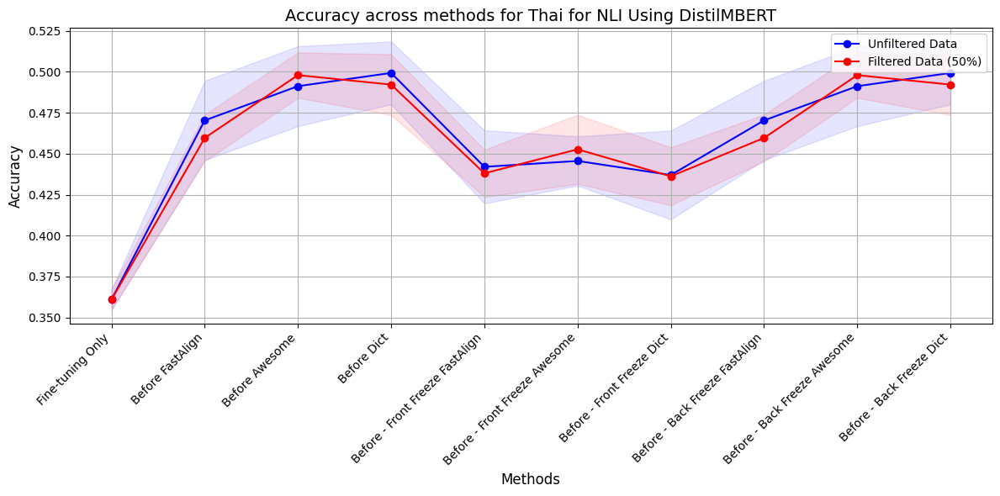

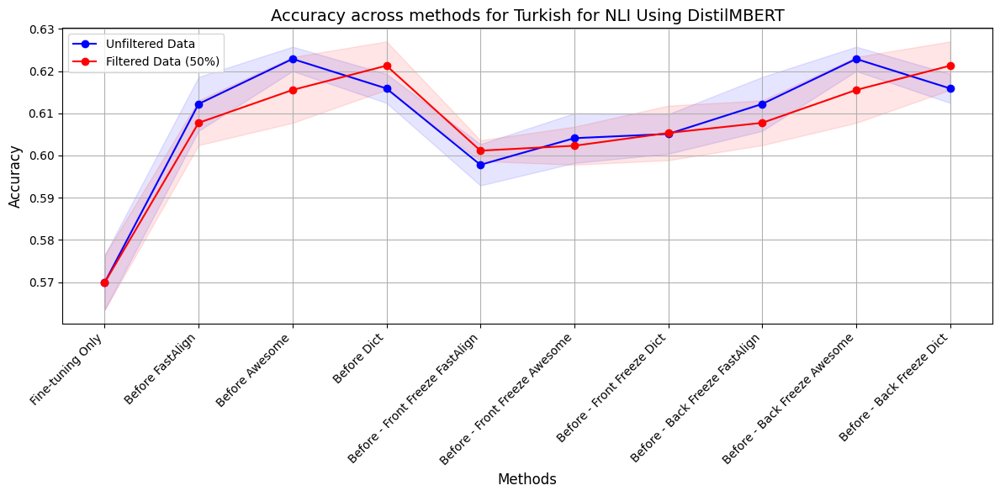

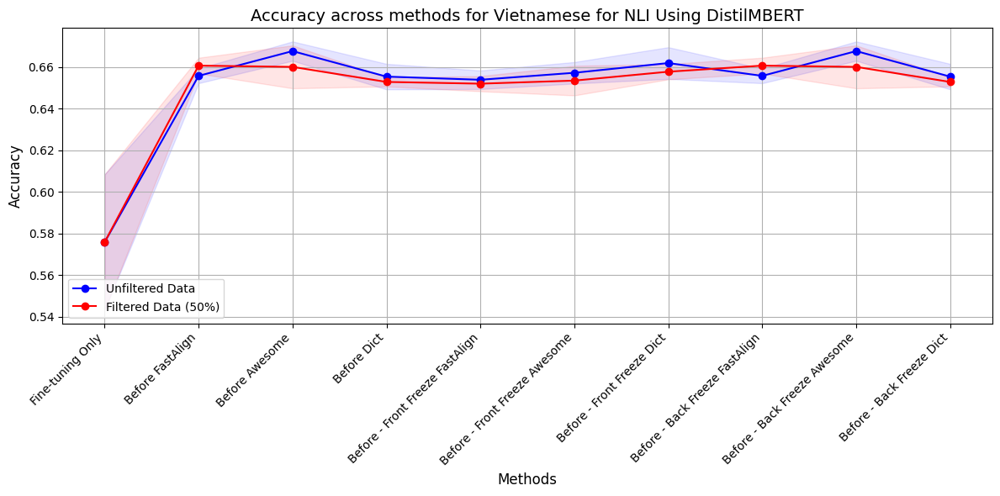

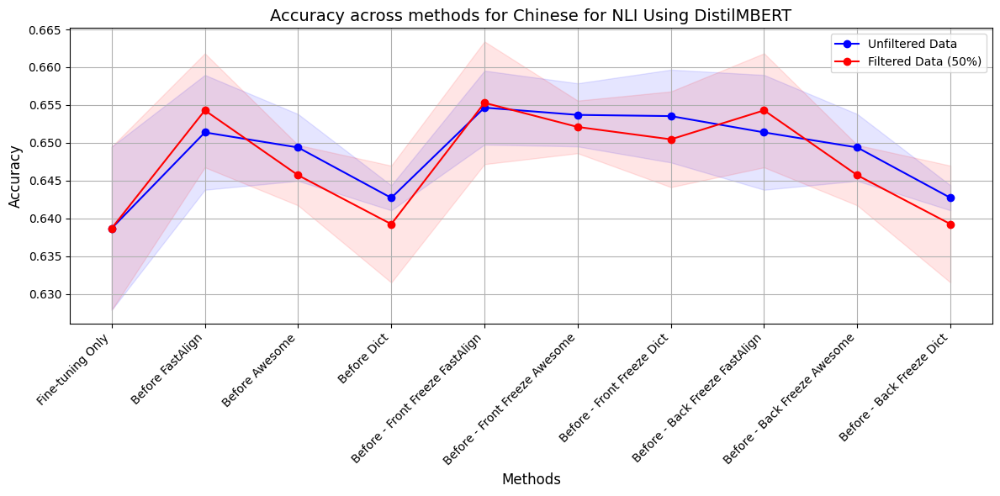

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import os


def mean_confidence_interval(data, confidence=0.95):
    n = len(data)
    m, se = np.mean(data), stats.sem(data)
    h = se * stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h


file_path_1 = 'raw_results\\distilbert-base-multilingual-cased__xnli__opus100.csv'
file_path_2 = 'raw_results\\distilbert-base-multilingual-cased__xnli__opus100_filtered_percent_50.csv'

data_1 = pd.read_csv(file_path_1)
data_2 = pd.read_csv(file_path_2)


method_names = {
    'baseline': 'Fine-tuning Only',
    'before_fastalign': 'Before FastAlign',
    'before_awesome': 'Before Awesome',
    'before_dico': 'Before Dict',
    'during_fastalign': 'During FastAlign',
    'during_awesome': 'During Awesome',
    'during_dico': 'During Dict',
    'freeze_realign_unfreeze_fastalign': 'Before - Front Freeze FastAlign',
    'freeze_realign_unfreeze_awesome': 'Before - Front Freeze Awesome',
    'freeze_realign_unfreeze_dico': 'Before - Front Freeze Dict',
    'freeze_realign_unfreeze_last_6_fastalign': 'Before - Back Freeze FastAlign',
    'freeze_realign_unfreeze_last_6_awesome': 'Before - Back Freeze Awesome',
    'freeze_realign_unfreeze_last_6_dico': 'Before - Back Freeze Dict',
}


plot_stats = {method: {lang: {'data_1': [], 'data_2': []} for lang in language_map} for method in method_names}


for data, key in [(data_1, 'data_1'), (data_2, 'data_2')]:
    for method in method_names:
        for lang_code in language_map:
            col_name = f'final_eval_{lang_code}_accuracy'
            if col_name in data.columns:
                filtered_data = data[data['method'] == method][col_name].dropna()
                if not filtered_data.empty:
                    plot_stats[method][lang_code][key] = mean_confidence_interval(filtered_data)


plot_directory = "nli_plots"
os.makedirs(plot_directory, exist_ok=True)


def plot_language_specific(methods_list, plot_stats, language_code, language_name):
    fig, ax = plt.subplots(figsize=(12, 6))
    
    methods_with_data = [method for method in methods_list if plot_stats[method][language_code]['data_1'] or plot_stats[method][language_code]['data_2']]
    x = np.arange(len(methods_with_data))

    colors = ['blue', 'red']  
    labels = ['Unfiltered Data', 'Filtered Data (50%)']

    for idx, (data_key, color, label) in enumerate(zip(['data_1', 'data_2'], colors, labels)):
        means = [plot_stats[method][language_code][data_key][0] for method in methods_with_data if plot_stats[method][language_code][data_key]]
        ci_lower = [plot_stats[method][language_code][data_key][1] for method in methods_with_data if plot_stats[method][language_code][data_key]]
        ci_upper = [plot_stats[method][language_code][data_key][2] for method in methods_with_data if plot_stats[method][language_code][data_key]]
        
        ax.plot(x, means, label=label, marker='o', linestyle='-', color=color)
        ax.fill_between(x, ci_lower, ci_upper, color=color, alpha=0.1)

    ax.set_xticks(x)
    ax.set_xticklabels([method_names.get(method, method) for method in methods_with_data], rotation=45, ha='right', fontsize=10)
    ax.set_xlabel('Methods', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)
    ax.set_title(f'Accuracy across methods for {language_name} for NLI Using DistilMBERT', fontsize=14)
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(plot_directory, f'{language_name.replace(" ", "_")}_accuracy.png'))  
    plt.show()
    plt.close()


for lang_code, lang_name in language_map.items():
    if any(plot_stats[method][lang_code]['data_1'] and plot_stats[method][lang_code]['data_2'] for method in method_names):  
        plot_language_specific(method_names.keys(), plot_stats, lang_code, lang_name)


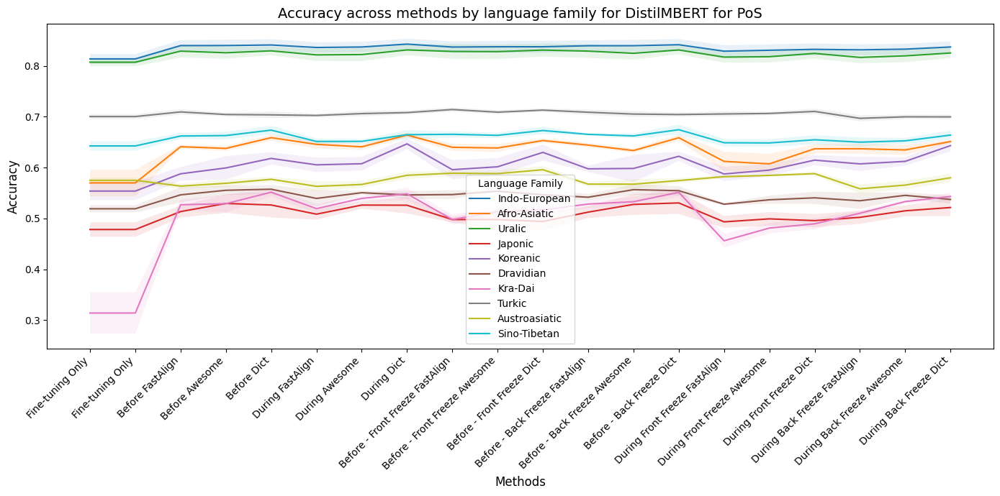

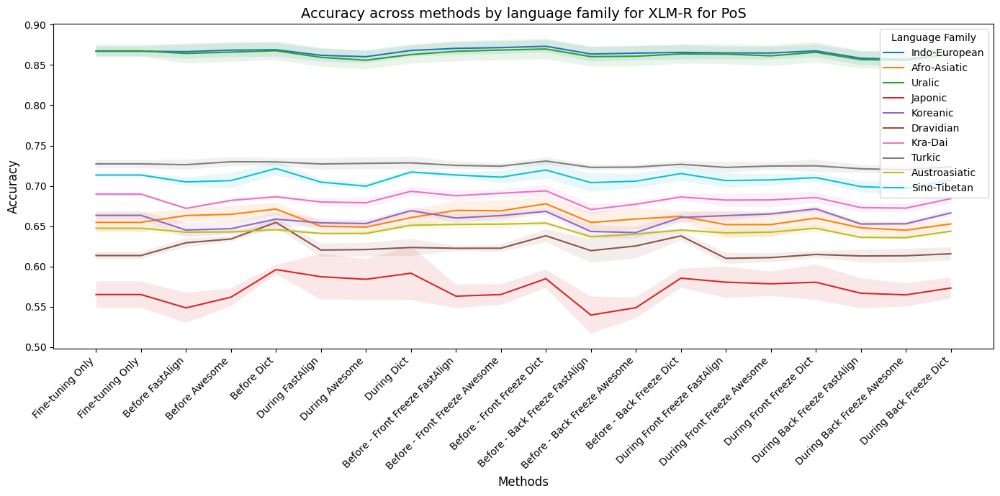

In [18]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import sem, t
from collections import defaultdict
import wandb

# Initialize wandb API
api = wandb.Api()

# Define the language map
language_map = {
    "same": "English",
    "avg": "Average",
    "af": "Afrikaans",
    "ar": "Arabic",
    "bg": "Bulgarian",
    "ca": "Catalan",
    "cs": "Czech",
    "da": "Danish",
    "de": "German",
    "el": "Greek",
    "es": "Spanish",
    "fa": "Persian",
    "fi": "Finnish",
    "fr": "French",
    "he": "Hebrew",
    "hi": "Hindi",
    "hu": "Hungarian",
    "it": "Italian",
    "ja": "Japanese",
    "ko": "Korean",
    "lt": "Lithuanian",
    "lv": "Latvian",
    "no": "Norwegian",
    "pl": "Polish",
    "pt": "Portuguese",
    "ro": "Romanian",
    "ru": "Russian",
    "sk": "Slovak",
    "sl": "Slovenian",
    "sv": "Swedish",
    "ta": "Tamil",
    "th": "Thai",
    "tr": "Turkish",
    "uk": "Ukrainian",
    "vi": "Vietnamese",
    "zh": "Chinese"
}

# Define language family map
language_family_map = {
    "English": "Indo-European",
    # "Average": "Average",
    "Afrikaans": "Indo-European",
    "Arabic": "Afro-Asiatic",
    "Bulgarian": "Indo-European",
    "Catalan": "Indo-European",
    "Czech": "Indo-European",
    "Danish": "Indo-European",
    "German": "Indo-European",
    "Greek": "Indo-European",
    "Spanish": "Indo-European",
    "Persian": "Indo-European",
    "Finnish": "Uralic",
    "French": "Indo-European",
    "Hebrew": "Afro-Asiatic",
    "Hindi": "Indo-European",
    "Hungarian": "Uralic",
    "Italian": "Indo-European",
    "Japanese": "Japonic",
    "Korean": "Koreanic",
    "Lithuanian": "Indo-European",
    "Latvian": "Indo-European",
    "Norwegian": "Indo-European",
    "Polish": "Indo-European",
    "Portuguese": "Indo-European",
    "Romanian": "Indo-European",
    "Russian": "Indo-European",
    "Slovak": "Indo-European",
    "Slovenian": "Indo-European",
    "Swedish": "Indo-European",
    "Tamil": "Dravidian",
    "Thai": "Kra-Dai",
    "Turkish": "Turkic",
    "Ukrainian": "Indo-European",
    "Vietnamese": "Austroasiatic",
    "Chinese": "Sino-Tibetan"
}

def mean_confidence_interval(data, confidence=0.95):
    if len(data) == 0:
        return np.nan, np.nan, np.nan
    a = np.array(data)
    n = len(a)
    m, se = np.mean(a), sem(a)
    h = se * t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

def fetch_and_process_runs(source, _langs, username="felixgaschi", method_name=None):
    runs_data = {lang: [] for lang in _langs}
    
    if source.endswith('.csv'):
        df = pd.read_csv(source)
        
        if method_name:
            df = df[df['method'] == method_name]
        
        for lang in _langs:
            accuracy_key = f'eval_{lang}_accuracy'
            if accuracy_key in df.columns:
                runs_data[lang] = df[accuracy_key].dropna().tolist()
            else:
                print(f"{lang} not in CSV...")
    else:
        runs = api.runs(f"{workspace}/{source}")
        for run in runs:
            if run.user.username == username:  
                for lang in langs:
                    accuracy_key = f"eval_{lang}_accuracy"
                    accuracy = run.summary.get(accuracy_key)
                    if accuracy is not None:
                        runs_data[lang].append(accuracy)
        assert all([len(runs) == 5 for language, runs in runs_data.items()])
    return runs_data

# Fetch XLM-R data
workspace = "align_freeze"
projects = [
    '3nl_34langs_baseline_udpos',
    '3nl_34langs_before_fastalign_udpos',
    '3nl_34langs_before_awesome_udpos',
    '3nl_34langs_before_dico_udpos',
    '3nl_34langs_during_fastalign_udpos',
    '3nl_34langs_during_awesome_udpos',
    '3nl_34langs_during_dico_udpos',
    '3nl_34langs_freeze_realign_unfreeze_fastalign_udpos',
    '3nl_34langs_freeze_realign_unfreeze_awesome_udpos',
    '3nl_34langs_freeze_realign_unfreeze_dico_udpos',
    '3nl_34langs_freeze_realign_unfreeze_last_6_fastalign_udpos',
    '3nl_34langs_freeze_realign_unfreeze_last_6_awesome_udpos',
    '3nl_34langs_freeze_realign_unfreeze_last_6_dico_udpos',
    '3nl_34langs_during_partial_freeze_front_fastalign_udpos',
    '3nl_34langs_during_partial_freeze_front_awesome_udpos',
    '3nl_34langs_during_partial_freeze_front_dico_udpos',
    '3nl_34langs_during_partial_freeze_back_fastalign_udpos',
    '3nl_34langs_during_partial_freeze_back_awesome_udpos',
    '3nl_34langs_during_partial_freeze_back_dico_udpos'
]

langs = ["same", "avg", "af", "ar", "bg", "ca", "cs", "da", "de", "el", "es", "fa", "fi", "fr", "he", "hi",
         "hu", "it", "ja", "ko", "lt", 'lv', 'no', 'pl', 'pt', 'ro', 'ru', 'sk', 'sl', 'sv', 'ta', 'th', 'tr', 'uk',
         'vi', 'zh']

xlmr_project_data = {}
trimmed_keys = []
for project in projects:
    key = project.replace('3nl_34langs_', "").replace('_udpos', "")
    xlmr_project_data[key] = fetch_and_process_runs(project, langs)
    trimmed_keys.append(key)

# Extracting DistilMBERT data from DataFrame (assuming 'unfiltered_df' exists)
dmbert_data_dict = {}

for trimmed_key in trimmed_keys:
    dmbert_data = unfiltered_df[unfiltered_df['method'] == trimmed_key]
    cols = []
    for col in dmbert_data.columns:
        try:
            if col.split('_')[-2] in langs and col.find('final') != -1:
                cols.append(col)
        except:
            pass
    dmbert_data = dmbert_data[cols]

    for lang in langs:
        col_name = f'final_eval_{lang}_accuracy'
        if col_name in dmbert_data.columns:
            if trimmed_key not in dmbert_data_dict:
                dmbert_data_dict[trimmed_key] = {}
            dmbert_data_dict[trimmed_key][lang] = list(dmbert_data[col_name].values)

all_methods = list(xlmr_project_data.keys())
all_methods.insert(0, 'baseline')

method_names = {
    'baseline': 'Fine-tuning Only',
    'before_fastalign': 'Before FastAlign',
    'before_awesome': 'Before Awesome',
    'before_dico': 'Before Dict',
    'during_fastalign': 'During FastAlign',
    'during_awesome': 'During Awesome',
    'during_dico': 'During Dict',
    'freeze_realign_unfreeze_fastalign': 'Before - Front Freeze FastAlign',
    'freeze_realign_unfreeze_awesome': 'Before - Front Freeze Awesome',
    'freeze_realign_unfreeze_dico': 'Before - Front Freeze Dict',
    'freeze_realign_unfreeze_last_6_fastalign': 'Before - Back Freeze FastAlign',
    'freeze_realign_unfreeze_last_6_awesome': 'Before - Back Freeze Awesome',
    'freeze_realign_unfreeze_last_6_dico': 'Before - Back Freeze Dict',
    'during_partial_freeze_front_fastalign': 'During Front Freeze FastAlign',
    'during_partial_freeze_front_awesome': 'During Front Freeze Awesome',
    'during_partial_freeze_front_dico': 'During Front Freeze Dict',
    'during_partial_freeze_back_fastalign': 'During Back Freeze FastAlign',
    'during_partial_freeze_back_awesome': 'During Back Freeze Awesome',
    'during_partial_freeze_back_dico': 'During Back Freeze Dict',
}

# Group by language family and calculate mean accuracy for DistilMBERT and XLM-R
family_data_dict_dmbert = defaultdict(lambda: defaultdict(list))
family_data_dict_xlmr = defaultdict(lambda: defaultdict(list))

for method in all_methods:
    for lang, accuracies in dmbert_data_dict.get(method, {}).items():
        if lang == 'avg':
            continue
        family = language_family_map[language_map[lang]]
        family_data_dict_dmbert[method][family].extend(accuracies)
    
    for lang, accuracies in xlmr_project_data.get(method, {}).items():
        if lang == 'avg':
            continue
        family = language_family_map[language_map[lang]]
        family_data_dict_xlmr[method][family].extend(accuracies)

# Calculate mean and confidence intervals for each family
def calculate_means_and_intervals(family_data_dict):
    family_means = {}
    family_conf_ints = {}
    for method, families in family_data_dict.items():
        family_means[method] = {}
        family_conf_ints[method] = {}
        for family, accuracies in families.items():
            if len(accuracies) > 0:
                mean, lower, upper = mean_confidence_interval(accuracies)
                family_means[method][family] = mean
                family_conf_ints[method][family] = (lower, upper)
            else:
                family_means[method][family] = np.nan
                family_conf_ints[method][family] = (np.nan, np.nan)
    return family_means, family_conf_ints

family_means_dmbert, family_conf_ints_dmbert = calculate_means_and_intervals(family_data_dict_dmbert)
family_means_xlmr, family_conf_ints_xlmr = calculate_means_and_intervals(family_data_dict_xlmr)

def plot_family_methods(family_means, family_conf_ints, all_methods, title):
    plt.figure(figsize=(14, 7))
    x_axis = np.arange(len(all_methods))
    families = list(next(iter(family_means.values())).keys())

    for family in families:
        means = [family_means[method][family] for method in all_methods]
        conf_ints = [family_conf_ints[method][family] for method in all_methods]
        lowers, uppers = zip(*conf_ints)
        
        plt.plot(x_axis, means, label=family)
        plt.fill_between(x_axis, lowers, uppers, alpha=0.1)

    professional_method_names = [method_names.get(method, 'Unknown Method') for method in all_methods]
    plt.xticks(x_axis, professional_method_names, rotation=45, ha='right', fontsize=10)

    plt.xlabel('Methods', fontsize=12)
    plt.ylabel('Accuracy', fontsize=12)
    plt.title(title, fontsize=14)

    plt.legend(title='Language Family')
    plt.tight_layout()

    plt.show()

# Plot the performance by language family for DistilMBERT and XLM-R
plot_family_methods(family_means_dmbert, family_conf_ints_dmbert, all_methods, 'Accuracy across methods by language family for DistilMBERT for PoS')
plot_family_methods(family_means_xlmr, family_conf_ints_xlmr, all_methods, 'Accuracy across methods by language family for XLM-R for PoS')


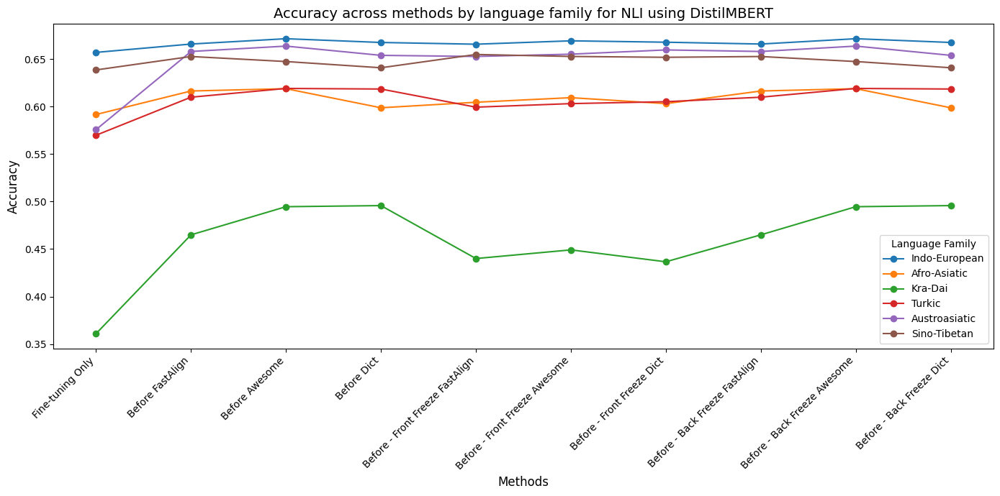

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import os
from collections import defaultdict

def mean_confidence_interval(data, confidence=0.95):
    n = len(data)
    m, se = np.mean(data), stats.sem(data)
    h = se * stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

# Define the language map
language_map = {
    "same": "English",
    "avg": "Average",
    "af": "Afrikaans",
    "ar": "Arabic",
    "bg": "Bulgarian",
    "ca": "Catalan",
    "cs": "Czech",
    "da": "Danish",
    "de": "German",
    "el": "Greek",
    "es": "Spanish",
    "fa": "Persian",
    "fi": "Finnish",
    "fr": "French",
    "he": "Hebrew",
    "hi": "Hindi",
    "hu": "Hungarian",
    "it": "Italian",
    "ja": "Japanese",
    "ko": "Korean",
    "lt": "Lithuanian",
    "lv": "Latvian",
    "no": "Norwegian",
    "pl": "Polish",
    "pt": "Portuguese",
    "ro": "Romanian",
    "ru": "Russian",
    "sk": "Slovak",
    "sl": "Slovenian",
    "sv": "Swedish",
    "ta": "Tamil",
    "th": "Thai",
    "tr": "Turkish",
    "uk": "Ukrainian",
    "vi": "Vietnamese",
    "zh": "Chinese"
}

# Define language family map
language_family_map = {
    "English": "Indo-European",
    "Average": "Average",
    "Afrikaans": "Indo-European",
    "Arabic": "Afro-Asiatic",
    "Bulgarian": "Indo-European",
    "Catalan": "Indo-European",
    "Czech": "Indo-European",
    "Danish": "Indo-European",
    "German": "Indo-European",
    "Greek": "Indo-European",
    "Spanish": "Indo-European",
    "Persian": "Indo-European",
    "Finnish": "Uralic",
    "French": "Indo-European",
    "Hebrew": "Afro-Asiatic",
    "Hindi": "Indo-European",
    "Hungarian": "Uralic",
    "Italian": "Indo-European",
    "Japanese": "Japonic",
    "Korean": "Koreanic",
    "Lithuanian": "Indo-European",
    "Latvian": "Indo-European",
    "Norwegian": "Indo-European",
    "Polish": "Indo-European",
    "Portuguese": "Indo-European",
    "Romanian": "Indo-European",
    "Russian": "Indo-European",
    "Slovak": "Indo-European",
    "Slovenian": "Indo-European",
    "Swedish": "Indo-European",
    "Tamil": "Dravidian",
    "Thai": "Kra-Dai",
    "Turkish": "Turkic",
    "Ukrainian": "Indo-European",
    "Vietnamese": "Austroasiatic",
    "Chinese": "Sino-Tibetan"
}

file_path_1 = 'raw_results/distilbert-base-multilingual-cased__xnli__opus100.csv'
file_path_2 = 'raw_results/distilbert-base-multilingual-cased__xnli__opus100_filtered_percent_50.csv'

data_1 = pd.read_csv(file_path_1)
data_2 = pd.read_csv(file_path_2)

method_names = {
    'baseline': 'Fine-tuning Only',
    'before_fastalign': 'Before FastAlign',
    'before_awesome': 'Before Awesome',
    'before_dico': 'Before Dict',
    'freeze_realign_unfreeze_fastalign': 'Before - Front Freeze FastAlign',
    'freeze_realign_unfreeze_awesome': 'Before - Front Freeze Awesome',
    'freeze_realign_unfreeze_dico': 'Before - Front Freeze Dict',
    'freeze_realign_unfreeze_last_6_fastalign': 'Before - Back Freeze FastAlign',
    'freeze_realign_unfreeze_last_6_awesome': 'Before - Back Freeze Awesome',
    'freeze_realign_unfreeze_last_6_dico': 'Before - Back Freeze Dict',
}

plot_stats = {method: {lang: {'data_1': [], 'data_2': []} for lang in language_map} for method in method_names}

# Grouping by language family and calculating the means
family_plot_stats = defaultdict(lambda: defaultdict(list))

for data, key in [(data_1, 'data_1'), (data_2, 'data_2')]:
    for method in method_names:
        for lang_code in language_map:
            if lang_code == 'avg':
                continue
            col_name = f'final_eval_{lang_code}_accuracy'
            if col_name in data.columns:
                filtered_data = data[data['method'] == method][col_name].dropna()
                if not filtered_data.empty:
                    mean, lower, upper = mean_confidence_interval(filtered_data)
                    family = language_family_map[language_map[lang_code]]
                    family_plot_stats[method][family].append(mean)

# Calculating the mean performance for each family and method
family_means = {}
for method in family_plot_stats:
    family_means[method] = {}
    for family in family_plot_stats[method]:
        family_means[method][family] = np.mean(family_plot_stats[method][family])

# Plotting function for language family
def plot_family_methods(family_means, method_names):
    plt.figure(figsize=(14, 7))
    x_axis = np.arange(len(method_names))
    families = list(next(iter(family_means.values())).keys())

    for family in families:
        means = [family_means[method][family] for method in method_names]
        plt.plot(x_axis, means, label=family, marker='o')

    professional_method_names = [method_names.get(method, 'Unknown Method') for method in method_names]
    plt.xticks(x_axis, professional_method_names, rotation=45, ha='right', fontsize=10)

    plt.xlabel('Methods', fontsize=12)
    plt.ylabel('Accuracy', fontsize=12)
    plt.title('Accuracy across methods by language family for NLI using DistilMBERT', fontsize=14)

    plt.legend(title='Language Family')
    plt.tight_layout()

    plt.show()

# Plot the performance by language family
plot_family_methods(family_means, method_names)
